# GAMA-12: Validation Checks (FULL)

In [1]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import numpy as np
from astropy.table import Table
import itertools


In [2]:
catname = "../../dmu1/dmu1_ml_GAMA-12/data/master_catalogue_gama-12_20180218.fits"
master_catalogue = Table.read(catname)

print("Number of sources in master catalogue: ", len(master_catalogue))

Number of sources in master catalogue:  12369415


In [3]:
field = master_catalogue["field"][0]
field = field.rstrip()    # remove whitespaces at the end of the sting
print(field)

GAMA-12


In [4]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

## 1/ Magnitude errors

In [7]:
# "DECam g", "DECam z",
u_bands = [           "KIDS u"]
g_bands = ["DECam g", "KIDS g", "SUPRIME g", "GPC1 g"]
r_bands = ["DECam r", "KIDS r", "SUPRIME r", "GPC1 r"]
i_bands = [           "KIDS i", "SUPRIME i", "GPC1 i"]
z_bands = ["DECam z",           "SUPRIME z", "GPC1 z", "VIRCAM Z"]
y_bands = [                     "SUPRIME y", "GPC1 y", "VIRCAM Y", "WFCAM Y"]

opt_mags = u_bands + g_bands + r_bands + i_bands + z_bands + y_bands

j_bands = ["WFCAM J", "VIRCAM J"]
h_bands = ["WFCAM H", "VIRCAM H"]
k_bands = ["WFCAM K", "VIRCAM K"]

ir_mags = j_bands + h_bands + k_bands

all_mags = opt_mags + ir_mags

In [5]:
def mag_vs_err(x, y, fig, ax, labels=("x", "y"), savefig=False):

    x_label, y_label = labels
    print(x_label)

    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & (x!=99.) & (y!=99.)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
   
    if len(x) == 0:
        print("No sources have {} values.".format(x_label))
        print("")
        return
  
    #"""
    if len(x) > 0:
        print("    Error max: {:.0f}".format(np.max(y)))
        err10 = y > 10
        if len(x[err10]) > 0:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.min(x[err10])))
        else:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.nan))
        err100 = y > 100
        if len(x[err100]) > 0:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.min(x[err100])))
        else:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.nan))
        err1000 = y > 1000
        if len(x[err1000]) > 0:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.min(x[err1000])))
        else:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.nan))
    else:
        print("    no data")
    print("")
    #"""

    # Plot
    ax.set_yscale('log')    # to place before scatter to avoid issues
    ax.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax.invert_xaxis()
    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])

    # Save ex. fig
    if savefig:
        survey_label = ((x_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_magVSmagerr_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')

        

KIDS u mag (aperture)
    Error max: 474057
    magerr > 10: Number of objects = 45166, min mag = 27.1
    magerr > 100: Number of objects = 4162, min mag = 29.7
    magerr > 1000: Number of objects = 412, min mag = 32.6

KIDS u mag (total)
    Error max: 816074
    magerr > 10: Number of objects = 81252, min mag = 25.4
    magerr > 100: Number of objects = 7841, min mag = 28.6
    magerr > 1000: Number of objects = 800, min mag = 32.0



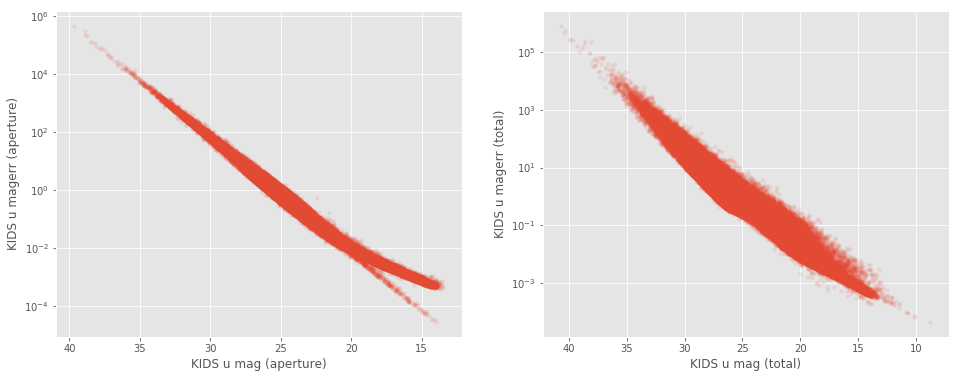

DECam g mag (aperture)
    Error max: 120140
    magerr > 10: Number of objects = 23542, min mag = 26.9
    magerr > 100: Number of objects = 2378, min mag = 29.8
    magerr > 1000: Number of objects = 237, min mag = 32.3

DECam g mag (total)
    Error max: 6778664448
    magerr > 10: Number of objects = 19481, min mag = 4.3
    magerr > 100: Number of objects = 1945, min mag = 4.3
    magerr > 1000: Number of objects = 213, min mag = 4.3



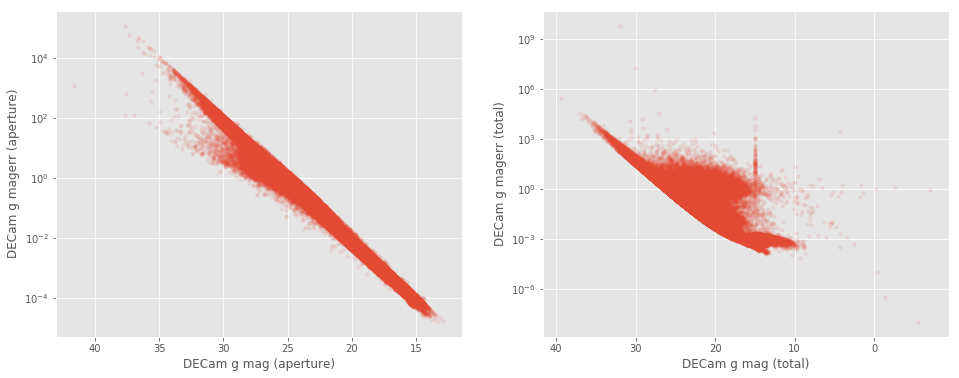

KIDS g mag (aperture)
    Error max: 234958
    magerr > 10: Number of objects = 12671, min mag = 26.5
    magerr > 100: Number of objects = 1170, min mag = 29.9
    magerr > 1000: Number of objects = 122, min mag = 33.5

KIDS g mag (total)
    Error max: 2511420
    magerr > 10: Number of objects = 21270, min mag = 26.3
    magerr > 100: Number of objects = 2011, min mag = 28.9
    magerr > 1000: Number of objects = 212, min mag = 33.3



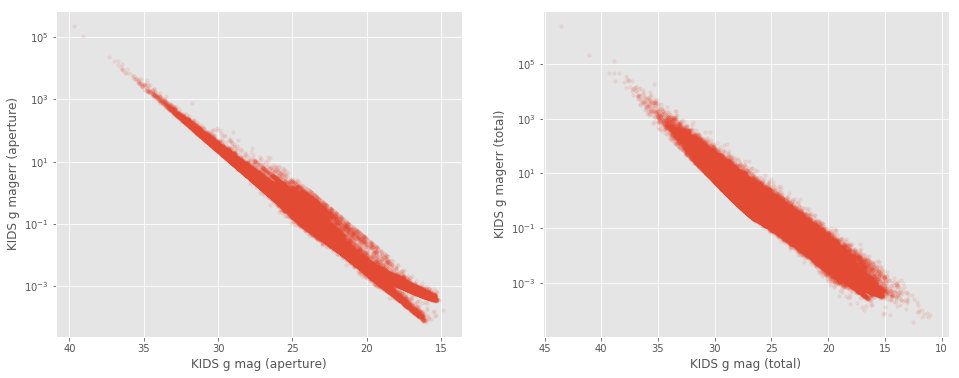

SUPRIME g mag (aperture)
    Error max: 432626720571392
    magerr > 10: Number of objects = 45015, min mag = 29.4
    magerr > 100: Number of objects = 15892, min mag = 31.7
    magerr > 1000: Number of objects = 6991, min mag = 34.5

SUPRIME g mag (total)
No sources have SUPRIME g mag (total) values.



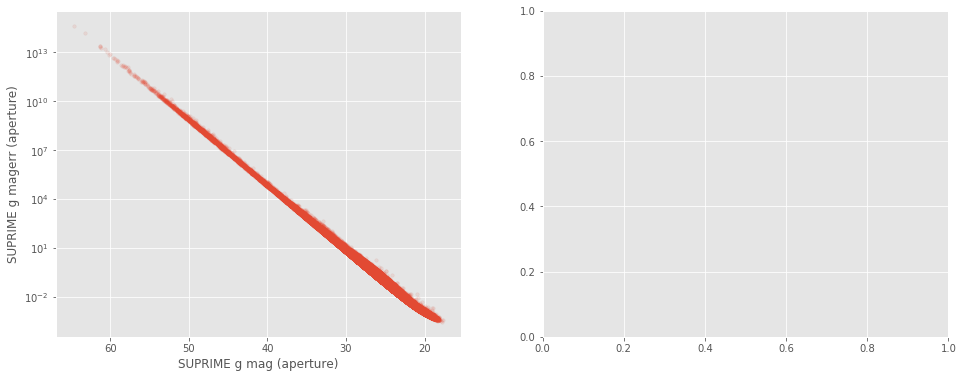

GPC1 g mag (aperture)
    Error max: 39303
    magerr > 10: Number of objects = 6782, min mag = 5.8
    magerr > 100: Number of objects = 715, min mag = 7.0
    magerr > 1000: Number of objects = 68, min mag = 9.7

GPC1 g mag (total)
    Error max: 62838
    magerr > 10: Number of objects = 7044, min mag = 5.3
    magerr > 100: Number of objects = 691, min mag = 9.4
    magerr > 1000: Number of objects = 83, min mag = 9.8



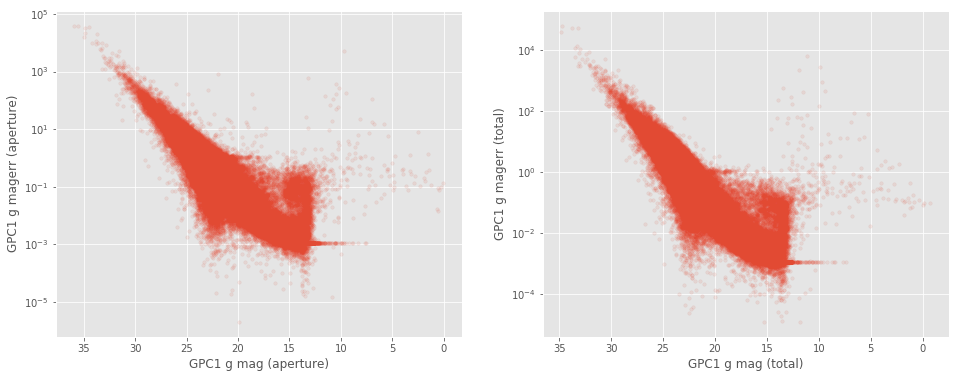

DECam r mag (aperture)
    Error max: 49588
    magerr > 10: Number of objects = 16928, min mag = 26.8
    magerr > 100: Number of objects = 1590, min mag = 29.4
    magerr > 1000: Number of objects = 139, min mag = 31.9

DECam r mag (total)
    Error max: 108642951168
    magerr > 10: Number of objects = 9695, min mag = 10.1
    magerr > 100: Number of objects = 961, min mag = 15.0
    magerr > 1000: Number of objects = 95, min mag = 15.0



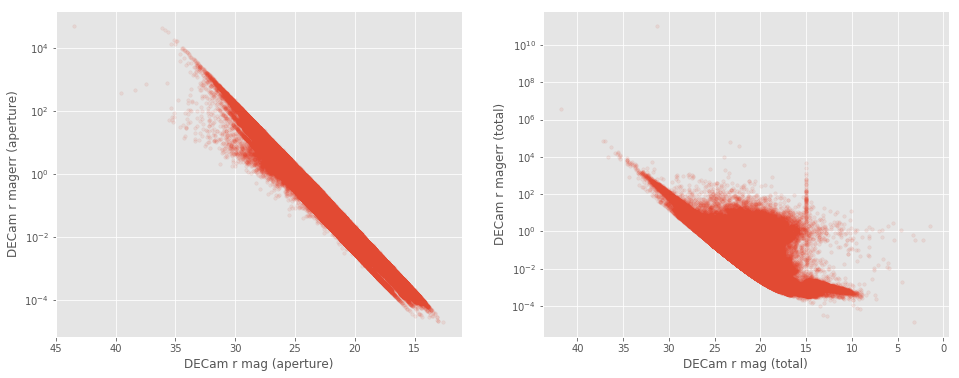

KIDS r mag (aperture)
    Error max: 29174
    magerr > 10: Number of objects = 3840, min mag = 28.0
    magerr > 100: Number of objects = 379, min mag = 31.1
    magerr > 1000: Number of objects = 34, min mag = 33.7

KIDS r mag (total)
    Error max: 3333929
    magerr > 10: Number of objects = 2800, min mag = 26.4
    magerr > 100: Number of objects = 255, min mag = 29.7
    magerr > 1000: Number of objects = 29, min mag = 33.0



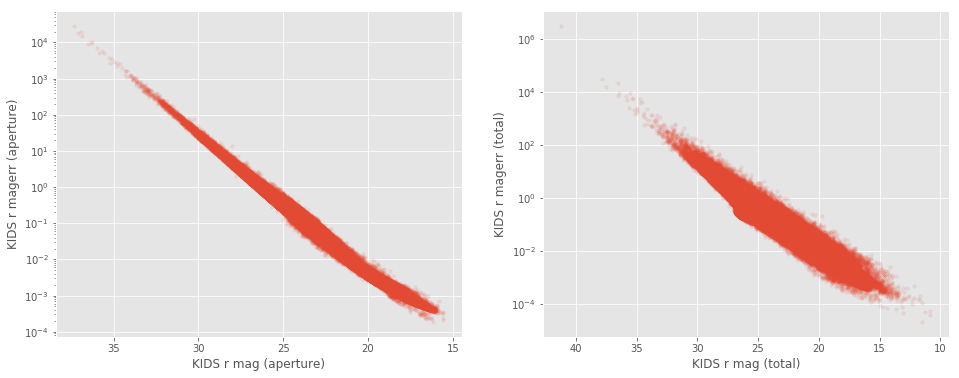

SUPRIME r mag (aperture)
    Error max: 101584199680
    magerr > 10: Number of objects = 20316, min mag = 24.7
    magerr > 100: Number of objects = 6687, min mag = 31.7
    magerr > 1000: Number of objects = 2978, min mag = 34.4

SUPRIME r mag (total)
    Error max: 281240862720
    magerr > 10: Number of objects = 21767, min mag = 21.8
    magerr > 100: Number of objects = 4734, min mag = 22.2
    magerr > 1000: Number of objects = 1726, min mag = 33.0



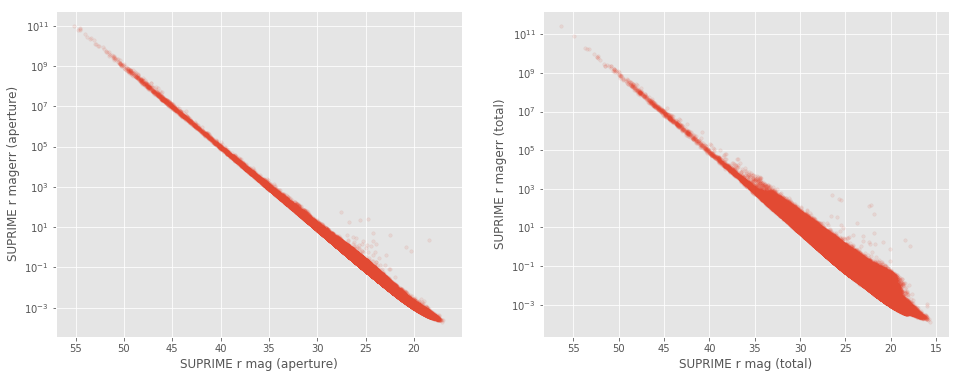

GPC1 r mag (aperture)
    Error max: 12718800
    magerr > 10: Number of objects = 2491, min mag = 4.9
    magerr > 100: Number of objects = 241, min mag = 8.5
    magerr > 1000: Number of objects = 25, min mag = 12.4

GPC1 r mag (total)
    Error max: 26058
    magerr > 10: Number of objects = 2498, min mag = 6.0
    magerr > 100: Number of objects = 242, min mag = 8.0
    magerr > 1000: Number of objects = 24, min mag = 12.3



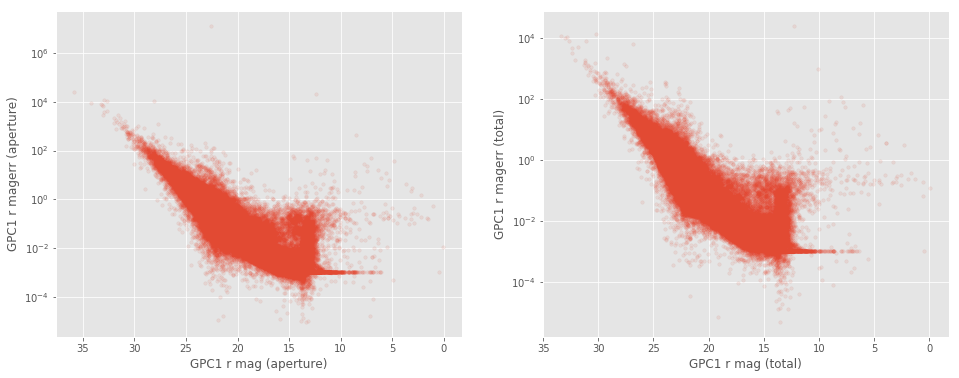

KIDS i mag (aperture)
    Error max: 143182000
    magerr > 10: Number of objects = 23475, min mag = 26.6
    magerr > 100: Number of objects = 2162, min mag = 29.2
    magerr > 1000: Number of objects = 208, min mag = 31.9

KIDS i mag (total)
    Error max: 685005
    magerr > 10: Number of objects = 41619, min mag = 24.5
    magerr > 100: Number of objects = 3985, min mag = 28.1
    magerr > 1000: Number of objects = 386, min mag = 31.4



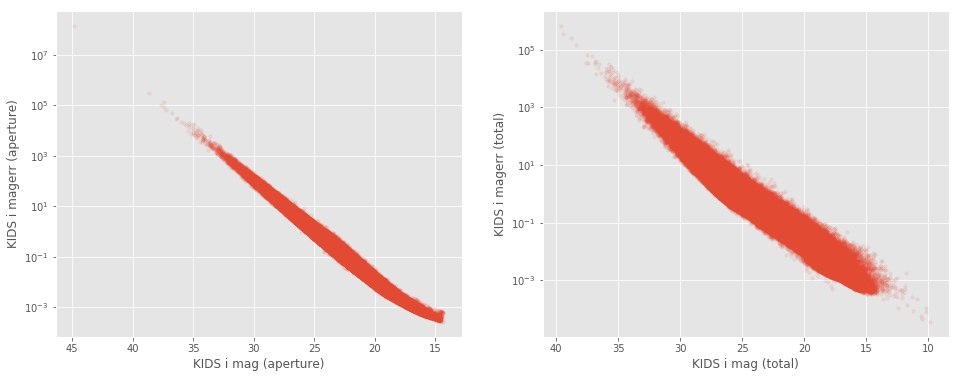

SUPRIME i mag (aperture)
    Error max: 122420961280
    magerr > 10: Number of objects = 11988, min mag = 29.2
    magerr > 100: Number of objects = 4391, min mag = 31.5
    magerr > 1000: Number of objects = 2397, min mag = 34.7

SUPRIME i mag (total)
    Error max: 236182454272
    magerr > 10: Number of objects = 17038, min mag = 24.4
    magerr > 100: Number of objects = 3439, min mag = 30.2
    magerr > 1000: Number of objects = 1447, min mag = 33.2



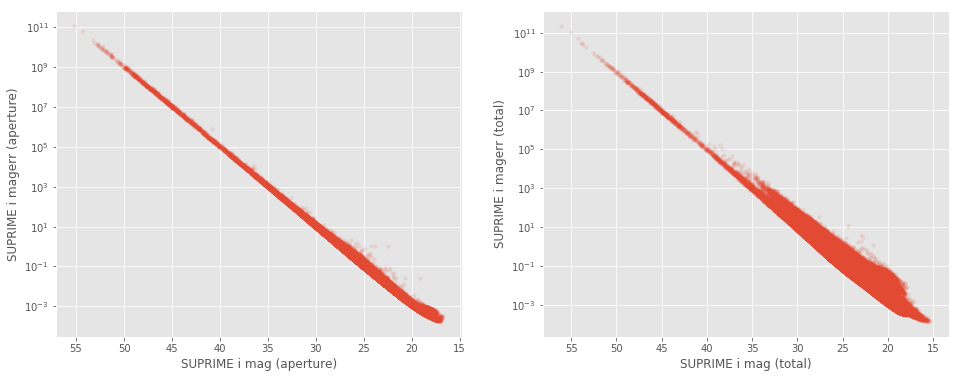

GPC1 i mag (aperture)
    Error max: 48510
    magerr > 10: Number of objects = 971, min mag = 10.1
    magerr > 100: Number of objects = 95, min mag = 25.3
    magerr > 1000: Number of objects = 9, min mag = 30.4

GPC1 i mag (total)
    Error max: 12864
    magerr > 10: Number of objects = 828, min mag = 12.9
    magerr > 100: Number of objects = 77, min mag = 25.9
    magerr > 1000: Number of objects = 9, min mag = 29.0



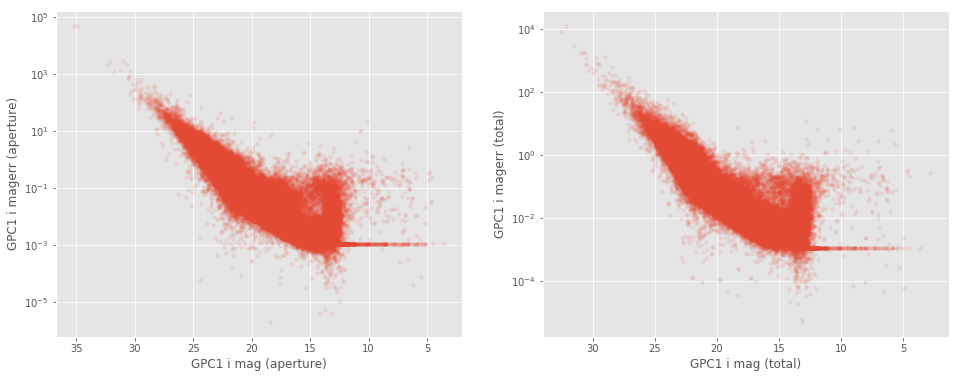

DECam z mag (aperture)
    Error max: 283001
    magerr > 10: Number of objects = 6611, min mag = 25.8
    magerr > 100: Number of objects = 648, min mag = 28.2
    magerr > 1000: Number of objects = 72, min mag = 32.0

DECam z mag (total)
    Error max: 31251
    magerr > 10: Number of objects = 1548, min mag = 22.9
    magerr > 100: Number of objects = 148, min mag = 27.6
    magerr > 1000: Number of objects = 15, min mag = 32.6



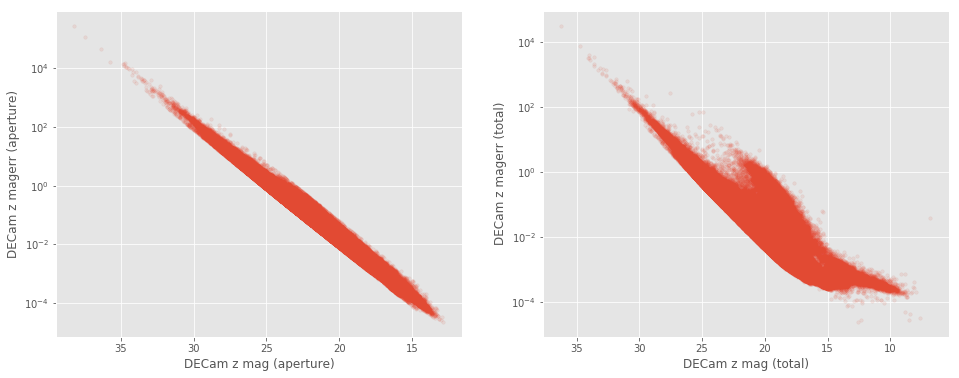

SUPRIME z mag (aperture)
    Error max: 1503947390976
    magerr > 10: Number of objects = 47372, min mag = 27.6
    magerr > 100: Number of objects = 14714, min mag = 30.8
    magerr > 1000: Number of objects = 6708, min mag = 33.7

SUPRIME z mag (total)
    Error max: 280896667648
    magerr > 10: Number of objects = 39486, min mag = 26.4
    magerr > 100: Number of objects = 9741, min mag = 29.0
    magerr > 1000: Number of objects = 3918, min mag = 32.3



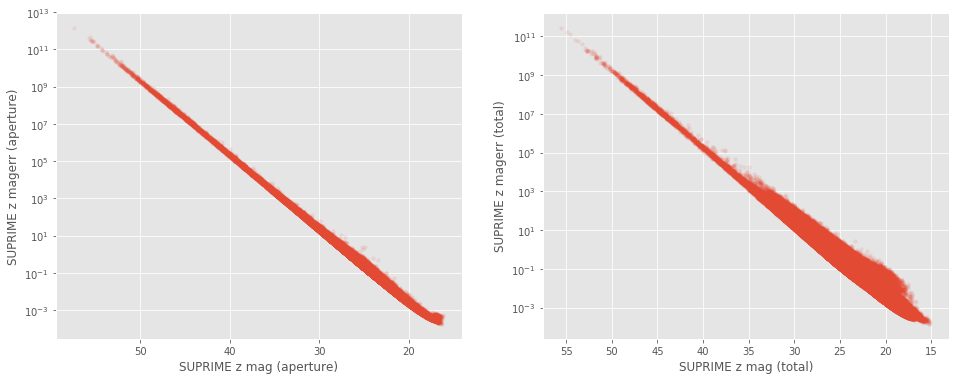

GPC1 z mag (aperture)
    Error max: 5586
    magerr > 10: Number of objects = 1141, min mag = 20.0
    magerr > 100: Number of objects = 116, min mag = 21.9
    magerr > 1000: Number of objects = 10, min mag = 29.9

GPC1 z mag (total)
    Error max: 25702
    magerr > 10: Number of objects = 1255, min mag = 20.8
    magerr > 100: Number of objects = 107, min mag = 22.3
    magerr > 1000: Number of objects = 13, min mag = 29.8



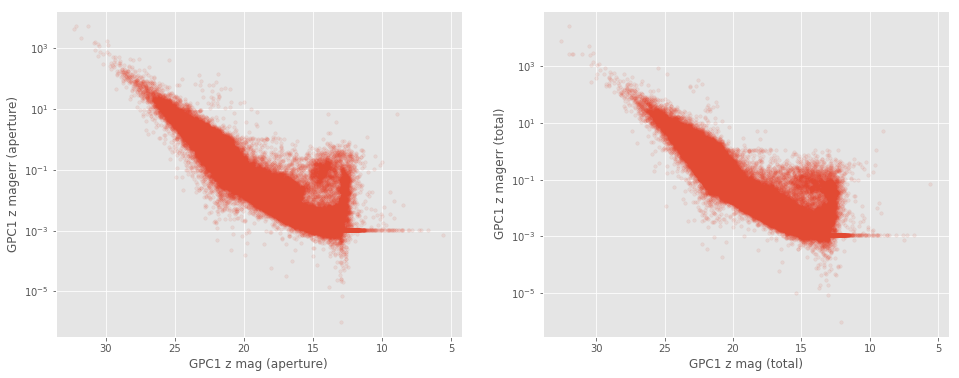

VIRCAM Z mag (aperture)
    Error max: 197
    magerr > 10: Number of objects = 28, min mag = 23.1
    magerr > 100: Number of objects = 1, min mag = 27.7
    magerr > 1000: Number of objects = 0, min mag = nan

VIRCAM Z mag (total)
    Error max: 55052
    magerr > 10: Number of objects = 1085, min mag = 22.1
    magerr > 100: Number of objects = 133, min mag = 26.3
    magerr > 1000: Number of objects = 9, min mag = 30.9



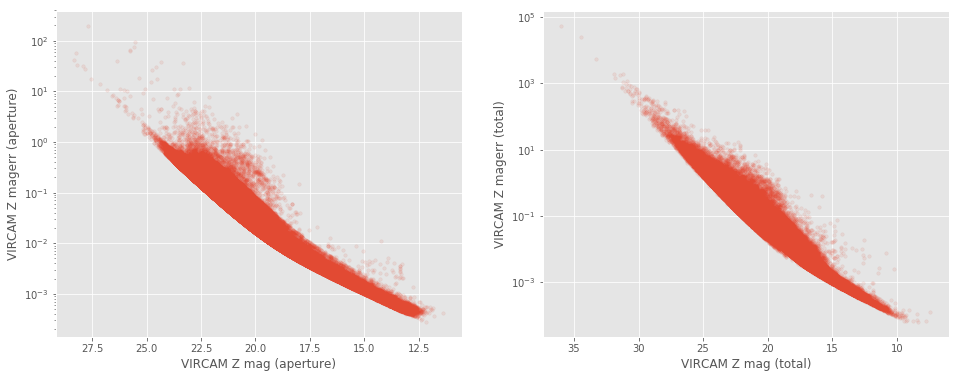

SUPRIME y mag (aperture)
    Error max: 11615134023680
    magerr > 10: Number of objects = 124186, min mag = 27.3
    magerr > 100: Number of objects = 31980, min mag = 29.7
    magerr > 1000: Number of objects = 10552, min mag = 32.7

SUPRIME y mag (total)
    Error max: 2147545776128
    magerr > 10: Number of objects = 83285, min mag = 24.9
    magerr > 100: Number of objects = 17407, min mag = 28.1
    magerr > 1000: Number of objects = 5436, min mag = 31.3



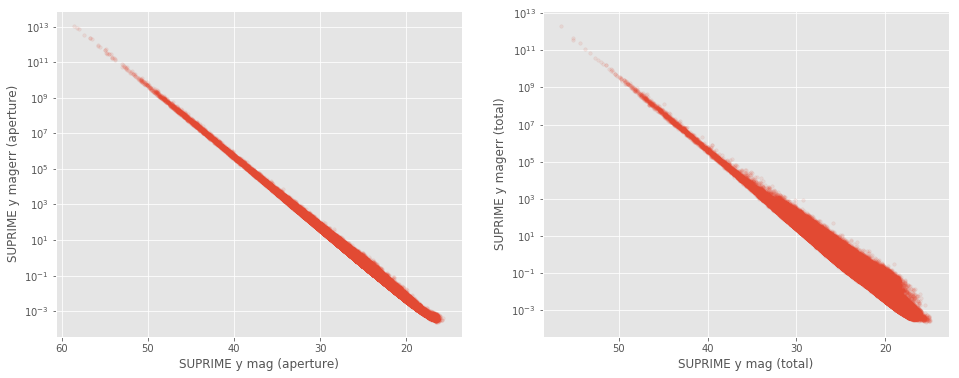

GPC1 y mag (aperture)
    Error max: 24054
    magerr > 10: Number of objects = 3696, min mag = 8.8
    magerr > 100: Number of objects = 368, min mag = 9.2
    magerr > 1000: Number of objects = 36, min mag = 9.2

GPC1 y mag (total)
    Error max: 47814
    magerr > 10: Number of objects = 5505, min mag = 8.8
    magerr > 100: Number of objects = 497, min mag = 8.9
    magerr > 1000: Number of objects = 63, min mag = 8.9



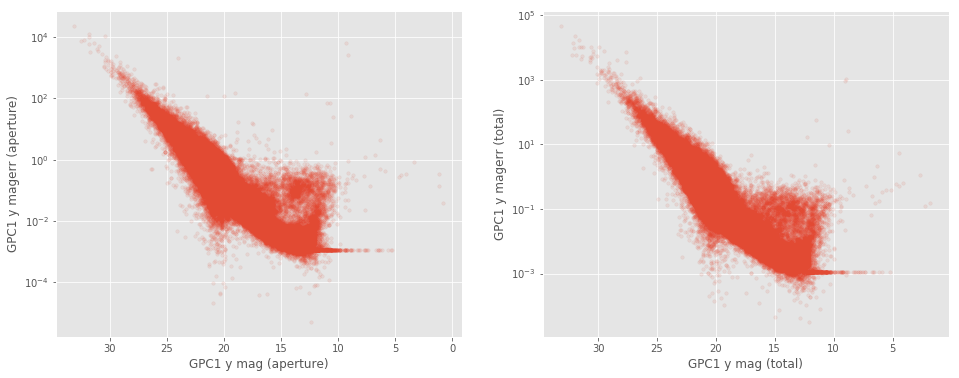

VIRCAM Y mag (aperture)
    Error max: 76
    magerr > 10: Number of objects = 8, min mag = 23.5
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

VIRCAM Y mag (total)
    Error max: 8605
    magerr > 10: Number of objects = 618, min mag = 22.2
    magerr > 100: Number of objects = 70, min mag = 27.1
    magerr > 1000: Number of objects = 4, min mag = 30.1



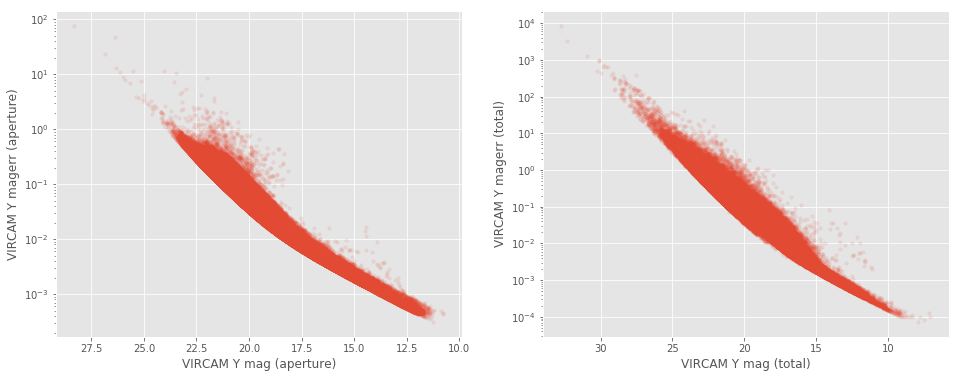

WFCAM Y mag (aperture)
    Error max: 682
    magerr > 10: Number of objects = 17, min mag = 25.0
    magerr > 100: Number of objects = 3, min mag = 27.8
    magerr > 1000: Number of objects = 0, min mag = nan

WFCAM Y mag (total)
    Error max: 125713
    magerr > 10: Number of objects = 1019, min mag = 22.0
    magerr > 100: Number of objects = 77, min mag = 26.9
    magerr > 1000: Number of objects = 8, min mag = 29.3



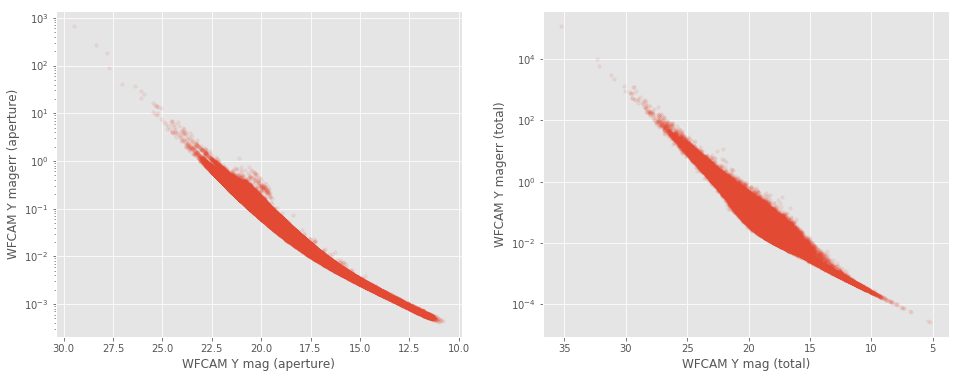

WFCAM J mag (aperture)
    Error max: 450
    magerr > 10: Number of objects = 31, min mag = 24.5
    magerr > 100: Number of objects = 5, min mag = 27.0
    magerr > 1000: Number of objects = 0, min mag = nan

WFCAM J mag (total)
    Error max: 375
    magerr > 10: Number of objects = 17, min mag = 24.3
    magerr > 100: Number of objects = 1, min mag = 27.9
    magerr > 1000: Number of objects = 0, min mag = nan



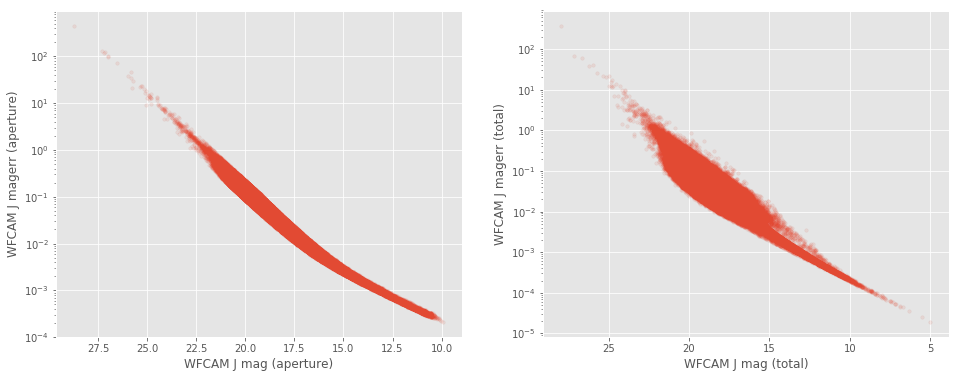

VIRCAM J mag (aperture)
    Error max: 805
    magerr > 10: Number of objects = 11, min mag = 22.5
    magerr > 100: Number of objects = 1, min mag = 28.0
    magerr > 1000: Number of objects = 0, min mag = nan

VIRCAM J mag (total)
    Error max: 2295
    magerr > 10: Number of objects = 560, min mag = 21.9
    magerr > 100: Number of objects = 69, min mag = 26.6
    magerr > 1000: Number of objects = 3, min mag = 30.5



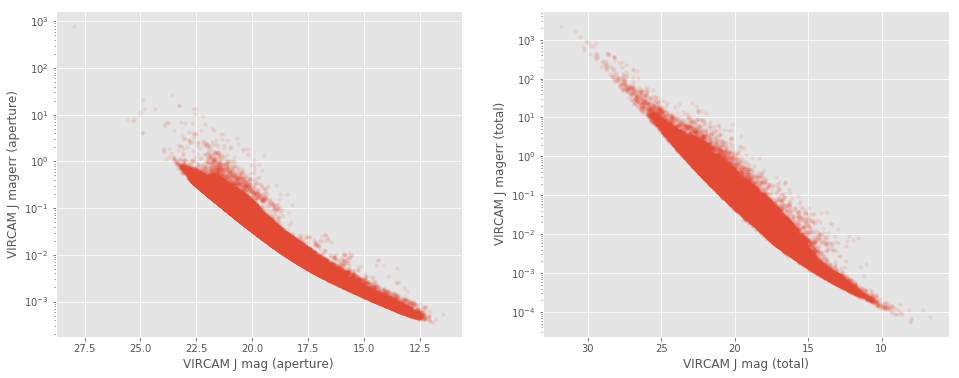

WFCAM H mag (aperture)
    Error max: 23
    magerr > 10: Number of objects = 1, min mag = 25.4
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

WFCAM H mag (total)
    Error max: 740
    magerr > 10: Number of objects = 123, min mag = 23.5
    magerr > 100: Number of objects = 20, min mag = 25.9
    magerr > 1000: Number of objects = 0, min mag = nan



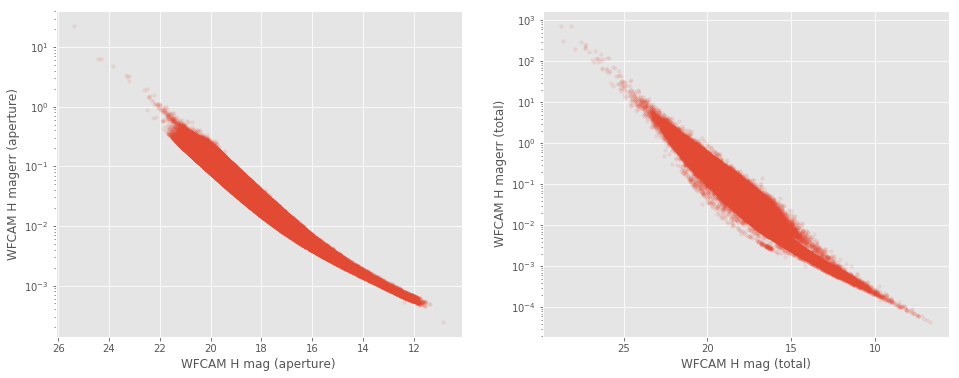

VIRCAM H mag (aperture)
    Error max: 2699
    magerr > 10: Number of objects = 399, min mag = 23.0
    magerr > 100: Number of objects = 40, min mag = 25.8
    magerr > 1000: Number of objects = 5, min mag = 28.7

VIRCAM H mag (total)
    Error max: 7053
    magerr > 10: Number of objects = 2361, min mag = 21.4
    magerr > 100: Number of objects = 219, min mag = 25.6
    magerr > 1000: Number of objects = 19, min mag = 27.8



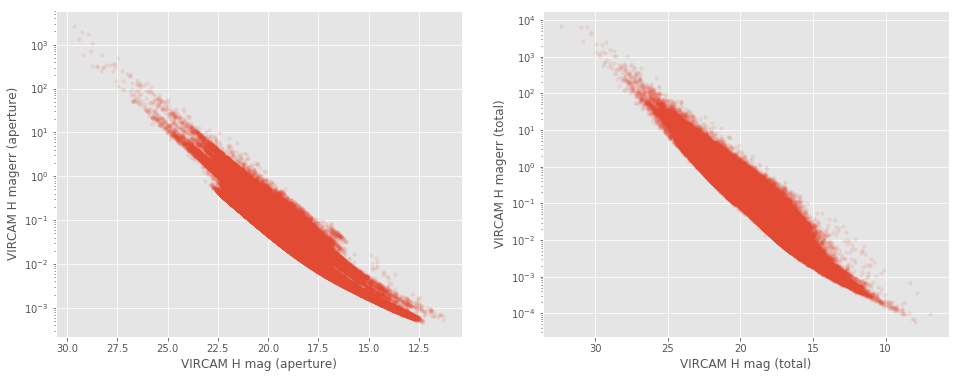

WFCAM K mag (aperture)
    Error max: 14
    magerr > 10: Number of objects = 1, min mag = 24.7
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

WFCAM K mag (total)
    Error max: 1004
    magerr > 10: Number of objects = 139, min mag = 22.6
    magerr > 100: Number of objects = 10, min mag = 26.3
    magerr > 1000: Number of objects = 1, min mag = 28.4



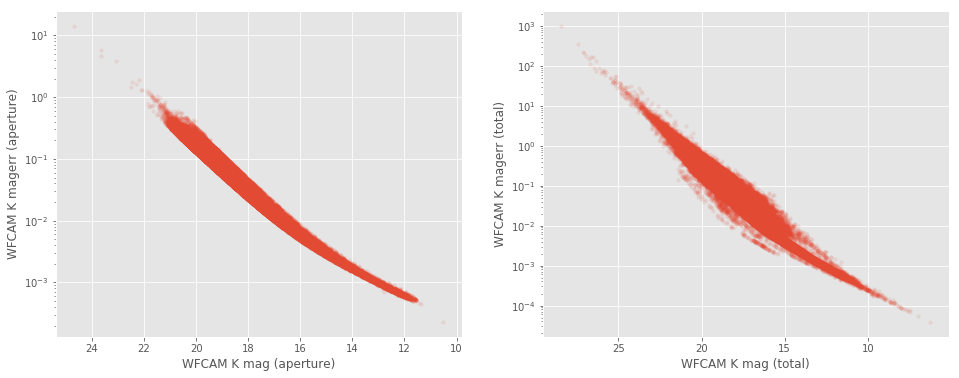

VIRCAM K mag (aperture)
    Error max: 10
    magerr > 10: Number of objects = 1, min mag = 25.4
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

VIRCAM K mag (total)
    Error max: 1322
    magerr > 10: Number of objects = 360, min mag = 21.7
    magerr > 100: Number of objects = 20, min mag = 26.5
    magerr > 1000: Number of objects = 1, min mag = 29.8



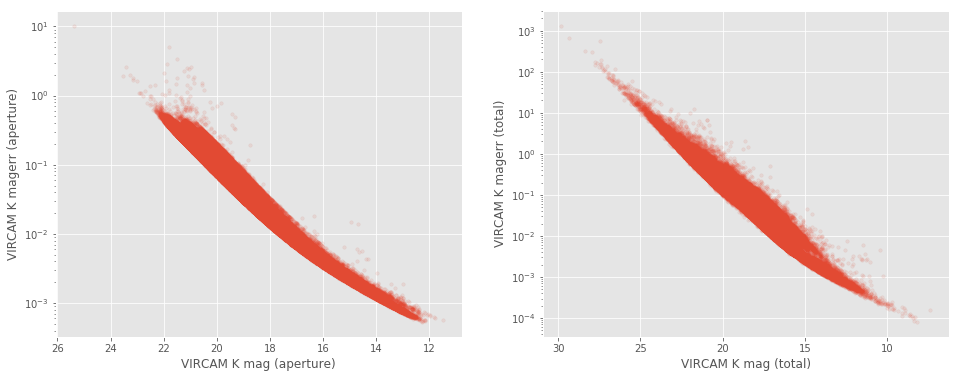

In [8]:
for mag in all_mags:
    
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
        
    basecol = mag.replace(" ", "_").lower()
    
    if basecol == "kids_r" or basecol == "suprime_r":
        savefig = True
    else:
        savefig=False
        
    col, ecol = "m_ap_{}".format(basecol), "merr_ap_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax1,
               labels=("{} mag (aperture)".format(mag), "{} magerr (aperture)".format(mag)), savefig=False)

    
    col, ecol = "m_{}".format(basecol), "merr_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax2,
               labels=("{} mag (total)".format(mag), "{} magerr (total)".format(mag)), savefig=savefig)
    
    display(fig)
    plt.close()


## 2. Magnitude and error issues

In [10]:
def flag_mag(mask, x1, y1, x2, y2, mask2=None, x3=None, y3=None,  
             labels1=("x", "y"), labels2=("x", "y"), labels3=("x", "y"), nb=2,
             savefig=False):

    if nb == 2:
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    else:
        fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 6))
    
    # mag vs magerr
    ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax1.scatter(x1, y1, marker='.', alpha=0.1, s=50)
    ax1.plot(x1[mask], y1[mask], 'b.')
    if mask2 is not None:
        ax1.plot(x1[mask2], y1[mask2], 'g.')
    ax1.invert_xaxis()
    ax1.set_xlabel(labels1[0])
    ax1.set_ylabel(labels1[1])
    
    # Comparing magnitudes
    ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
    ax2.plot(x2[mask], y2[mask], 'b.')
    if mask2 is not None:
        ax2.plot(x2[mask2], y2[mask2], 'g.')
    ax2.invert_xaxis()
    ax2.invert_yaxis()
    ax2.set_xlabel(labels2[0])
    ax2.set_ylabel(labels2[1])
    
    if nb >= 3:
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask], y3[mask], 'b.')
        if mask2 is not None:
            ax3.plot(x3[mask2], y3[mask2], 'g.')
        ax3.invert_xaxis()
        ax3.invert_yaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Save ex. fig
    if savefig:
        survey_label = ((labels1[0].replace(" ", "_")).replace("(", "")).replace(")", "")
        if "GPC1 " in labels1[0]:
            figname = field + "_gpc1Issues_" + survey_label + ".png"
        elif "DECam" in labels1[0]:
            figname = field + "_decamIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
        
    display(fig)
    plt.close()


### 2.a Pan-STARRS Aperture and Total magnitudes

GPC1 g
   Number of flagged objects: 555


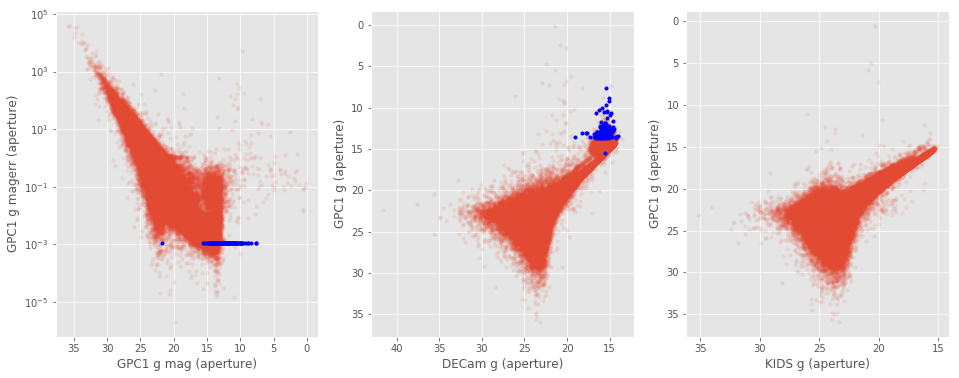

GPC1 r
   Number of flagged objects: 1042


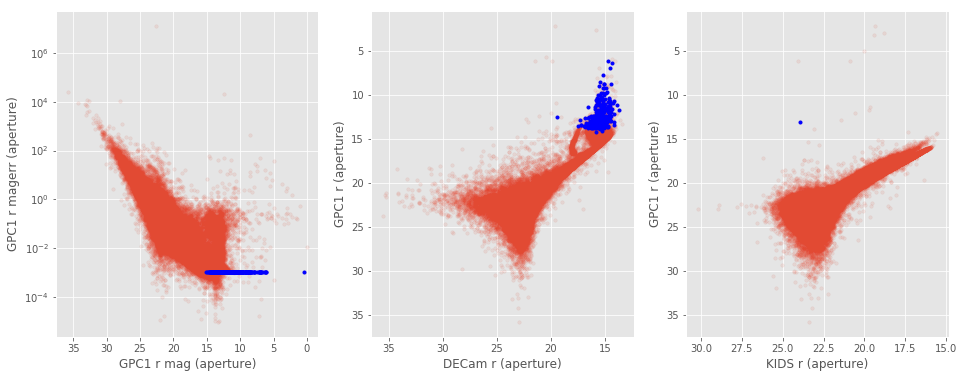

GPC1 i
   Number of flagged objects: 980


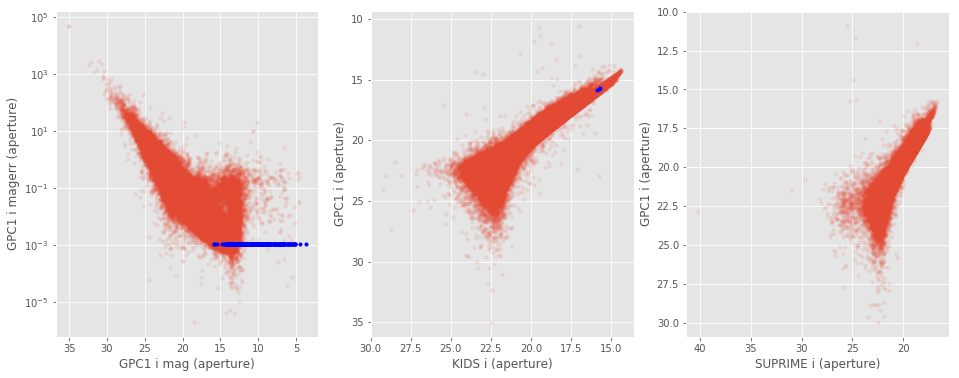

GPC1 z
   Number of flagged objects: 781


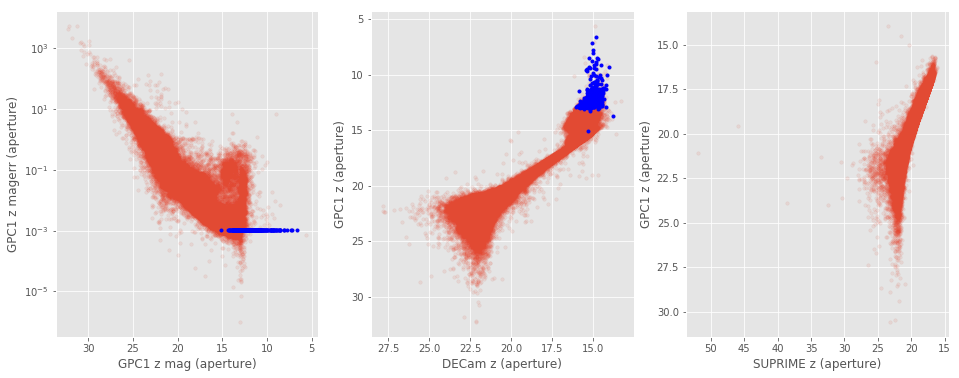

GPC1 y
   Number of flagged objects: 300


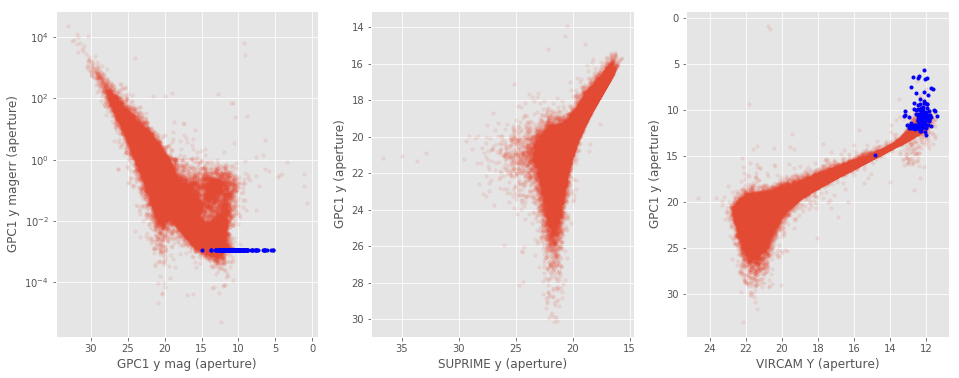

In [12]:
ps1_err = 0.0010860000038519502
bands = ['g', 'r', 'i', 'z', 'y']

for i, surveys in enumerate([g_bands, r_bands, i_bands, z_bands, y_bands]):
    surveys.insert(0, surveys.pop(surveys.index('GPC1 '+ bands[i])))
    print(surveys[0])
    
    basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
    col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
    ecol1 = "merr_ap_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_ap_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (aperture)".format(surveys[2]), "{} (aperture)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'gpc1_g':
        savefig = True
    else:
        savefig = False

        
    mask = np.where(master_catalogue[ecol1] == ps1_err)
    print ('   Number of flagged objects:', len(master_catalogue[ecol1][mask]))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                    master_catalogue[col2], master_catalogue[col1], 
                    x3=x3, y3=y3,
                    labels1=("{} mag (aperture)".format(surveys[0]), "{} magerr (aperture)".format(surveys[0])),
                    labels2=("{} (aperture)".format(surveys[1]), "{} (aperture)".format(surveys[0])),
                    labels3=labels3, nb=len(surveys), savefig=savefig)

### 2.b. DECaLS total magnitudes

DECam g
   Number of flagged objects (m=14.999935): 97
   Number of flagged objects (m < 7 (and m=0)): 29 (6)


/data/vault/epons/conda_envs/herschelhelp_internal/lib/python3.6/site-packages/astropy/table/column.py:929: RuntimeWarning: invalid value encountered in less
  return getattr(self.data, oper)(other)


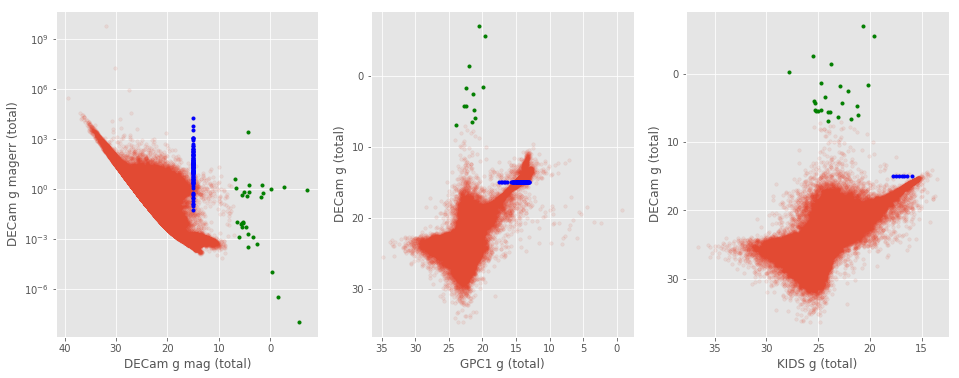

DECam r
   Number of flagged objects (m=14.999935): 99
   Number of flagged objects (m < 7 (and m=0)): 16 (0)


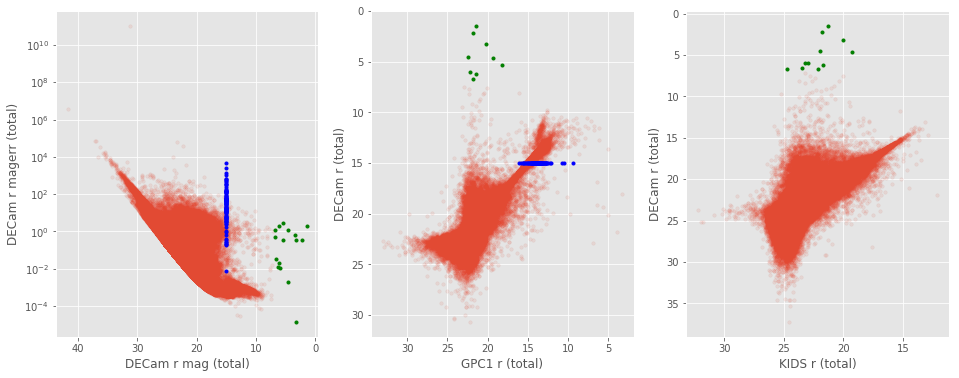

DECam z
   Number of flagged objects (m=14.999935): 0
   Number of flagged objects (m < 7 (and m=0)): 1 (0)


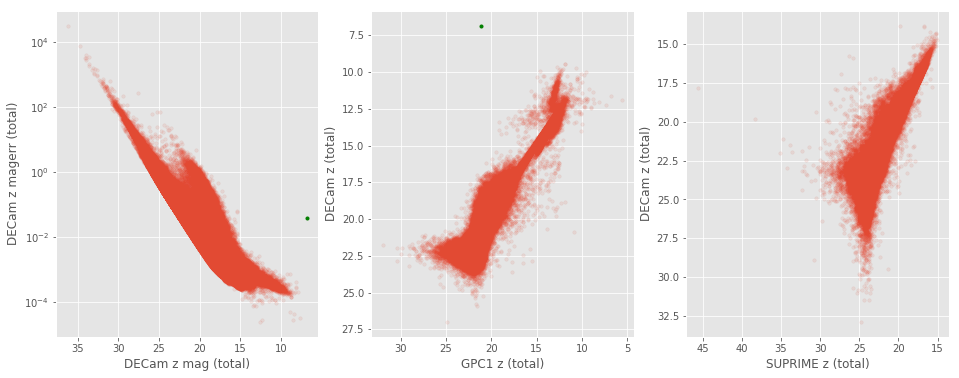

In [15]:
bands = ['g', 'r', 'z']

for i, surveys in enumerate([g_bands, r_bands, z_bands]):
    surveys.insert(0, surveys.pop(surveys.index('DECam '+ bands[i])))
    print(surveys[0])
    
    basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
    col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
    ecol1 = "merr_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (total)".format(surveys[2]), "{} (total)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'decam_r':
        savefig = True
    else:
        savefig = False

    def cstr(s, color=34):
        # ANSI color: red: color=31, blue: color=34, green:color=32
        return "\x1b[{}m{}\x1b[0m".format(color, s)


    mask = (master_catalogue[col1] == 14.999935)
    print ('   Number of flagged objects ({}): {}'.format(cstr('m=14.999935'), len(master_catalogue[ecol1][mask])))
    mask2 = (master_catalogue[col1] < 7)
    mag0 = (master_catalogue[col1] < 0)
    print('   Number of flagged objects ({}): {} ({})'.format(cstr('m < 7 (and m=0)', color=32),\
                                                                           len(master_catalogue[ecol1][mask2]),\
                                                                           len(master_catalogue[ecol1][mag0])))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                   master_catalogue[col2], master_catalogue[col1], 
                   x3=x3, y3=y3, mask2=mask2, 
                   labels1=("{} mag (total)".format(surveys[0]), "{} magerr (total)".format(surveys[0])),
                   labels2=("{} (total)".format(surveys[1]), "{} (total)".format(surveys[0])),
                   labels3=labels3, nb=len(surveys), savefig=savefig)

## 3/ Outliers

$$chi^2 = \frac{(mag_{1}-mag_{2})^2}{magerr_{1}^2 + magerr_{2}^2}$$ 
<br>
__Interquartile range (IQR) and outliers:__<br>
We consider as outliers objects which have a high $chi^2$, about $5\sigma$ away from the mean.<br>
$25th, 75th \;percentile = 0.6745\sigma$<br>
$IQR = (75th \;percentile - 25th \;percentile) = 0.6745\sigma * 2 = 1.349\sigma$<br>
$75th \;percentile + 3.2\times IQR = 0.6745\sigma + 3.2\times1.349\sigma = 5\sigma$
<br><br>
$$outliers == [chi^2 >  (75th \;percentile + 3.2\times (75th \;percentile - 25th \;percentile))]$$
<br><br>
__NB:__<br>
Bright sources tend to have their errors underestimated with values as low as $10^{-6}$, which is unrealistic. So to avoid high $chi^2$ due to unrealistic small errors, we clip the error to get a minimum value of 0.1% (i.e. all errors smaller then $10^{-3}$ are set to $10^{-3}$).

In [22]:
def outliers(x, y, xerr, yerr, labels=["x", "y"], savefig=False):
    
    import matplotlib
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(xerr) & np.isfinite(yerr)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    xerr = np.copy(xerr[mask])
    yerr = np.copy(yerr[mask])
    
    # mag1 - mag2
    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    # Set the minimum error to 10^-3
    np.clip(xerr, 1e-3, np.max(xerr), out=xerr)
    np.clip(yerr, 1e-3, np.max(yerr), out=yerr)

    # Median, Median absolute deviation and 1% and 99% percentiles
    diff_median = np.median(diff)
    diff_mad = np.median(np.abs(diff - diff_median))
    diff_1p, diff_99p = np.percentile(diff, [1., 99.])
    diff_25p, diff_75p = np.percentile(diff, [25., 75.])
    
    
    diff_label = "{} - {}".format(y_label, x_label)

    print("{} ({} sources):".format(diff_label, len(x)))
    print("- Median: {:.2f}".format(diff_median))
    print("- Median Absolute Deviation: {:.2f}".format(diff_mad))
    print("- 1% percentile: {}".format(diff_1p))
    print("- 99% percentile: {}".format(diff_99p))

    
    # Chi2 (Normalized difference)   
    ichi2 = np.power(diff, 2) / (np.power(xerr, 2) + np.power(yerr, 2))
    
    # Use only non-null values of ichi2
    mask2 = ichi2 != 0.0
    diff, ichi2 = np.copy(diff[mask2]), np.copy(ichi2[mask2])
    x, y, xerr, yerr = np.copy(x[mask2]), np.copy(y[mask2]), np.copy(xerr[mask2]), np.copy(yerr[mask2])

    # Outliers (5sigma)
    log_ichi2_25p, log_ichi2_75p = np.percentile(np.log10(ichi2), [25., 75.])
    out_lim = log_ichi2_75p + 3.2*abs(log_ichi2_25p-log_ichi2_75p)
    
    outliers = np.log10(ichi2) > out_lim 
    nb_outliers = len(x[outliers])
    
    print("Outliers separation: log(chi2) = {:.2f}".format(out_lim))
    print("Number of outliers: {}".format(nb_outliers))

    print("")

    # Comparing mag
    ax1.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax1.scatter(x[outliers], y[outliers], marker='.', c='b', alpha=0.3, s=50, label='Outliers ({})'.format(nb_outliers))
    min_val = np.min(np.r_[x, y])
    max_val = np.max(np.r_[x, y])
    ax1.autoscale(False)
    ax1.plot([min_val, max_val], [min_val, max_val], "k:")
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y_label)
    ax1.legend(loc='lower right', numpoints=1)
    

    # Chi2 vs Diff
    #ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax2.scatter(diff, np.log10(ichi2), marker='.', alpha=0.1, s=50)
    if nb_outliers != 0:
        ax2.scatter(diff[outliers], np.log10(ichi2[outliers]), marker='.', alpha=0.3, s=50, color='b',\
                    label='Outliers ({})'.format(nb_outliers))
    ax2.axhline(out_lim, color='grey', linestyle=':')
    ax2.set_xlabel(diff_label)
    ax2.set_ylabel('log(chi2)')
    ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(np.log10(ichi2), ax=ax3, bins='knuth', facecolor='red', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    if nb_outliers > 3:
        n, bins, patches = vz.hist(np.log10(ichi2[outliers]), ax=ax3, bins='knuth', facecolor='b', lw = 2, alpha=0.7,\
                                   orientation="horizontal")
    ax3.axhline(out_lim, color='grey', linestyle=':')
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_outliers_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

GPC1 g (aperture) - DECam g (aperture) (661235 sources):
- Median: -0.10
- Median Absolute Deviation: 0.28
- 1% percentile: -3.323600387573242
- 99% percentile: 2.2757487106323264
Outliers separation: log(chi2) = 4.93
Number of outliers: 2254



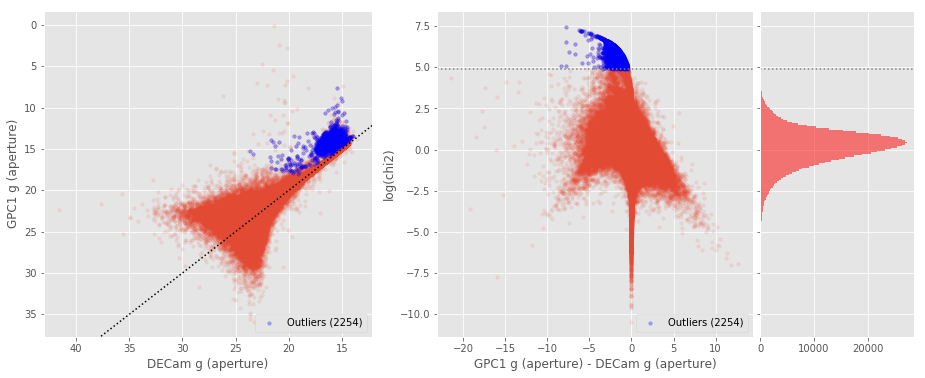

GPC1 g (total) - DECam g (total) (670998 sources):
- Median: -0.00
- Median Absolute Deviation: 0.26
- 1% percentile: -3.400665760040283
- 99% percentile: 2.0117679786682143
Outliers separation: log(chi2) = 5.04
Number of outliers: 243



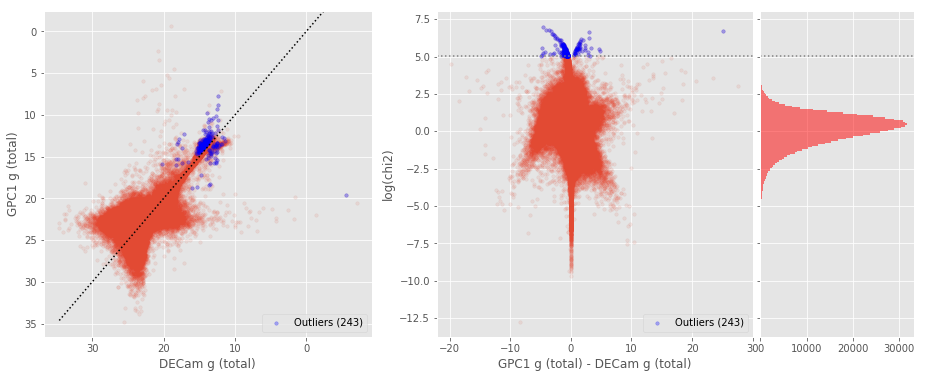

KIDS g (aperture) - DECam g (aperture) (1892873 sources):
- Median: 0.24
- Median Absolute Deviation: 0.28
- 1% percentile: -2.421456756591797
- 99% percentile: 1.7177793884277346
Outliers separation: log(chi2) = 5.62
Number of outliers: 113



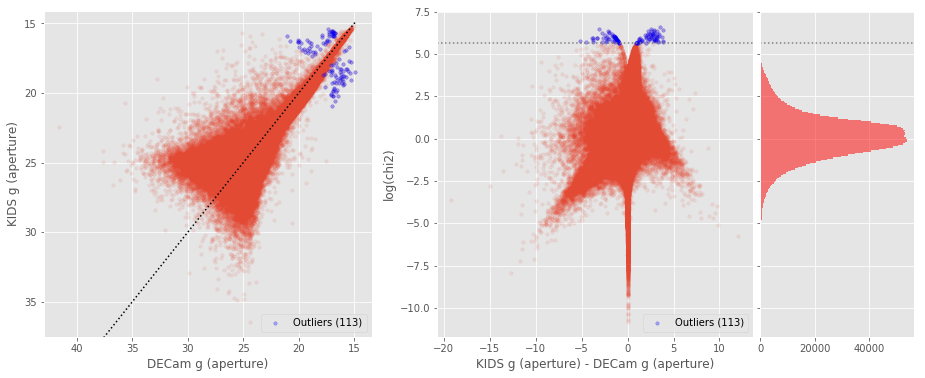

KIDS g (total) - DECam g (total) (1924585 sources):
- Median: 0.12
- Median Absolute Deviation: 0.24
- 1% percentile: -1.9983771514892579
- 99% percentile: 2.143661956787107
Outliers separation: log(chi2) = 4.70
Number of outliers: 195



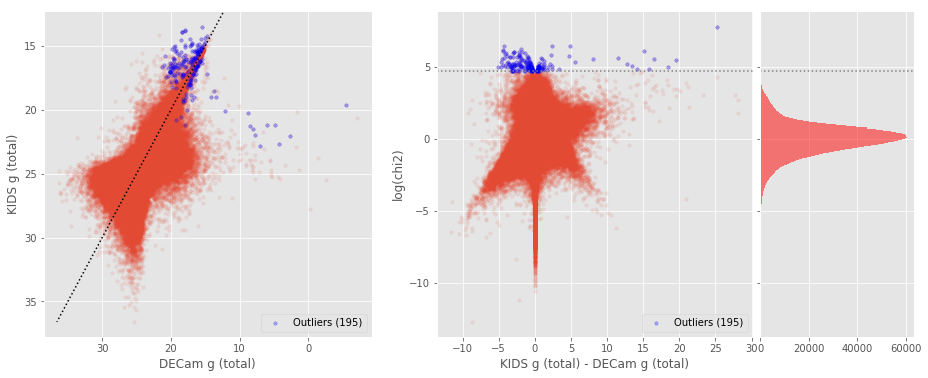

SUPRIME g (aperture) - DECam g (aperture) (620334 sources):
- Median: 0.11
- Median Absolute Deviation: 0.28
- 1% percentile: -2.5734726333618165
- 99% percentile: 1.9980712890625032
Outliers separation: log(chi2) = 5.19
Number of outliers: 168



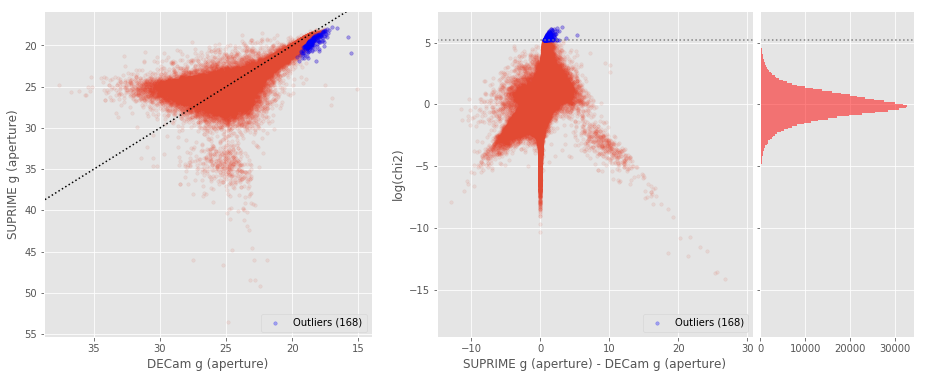

No sources have both DECam g (total) and SUPRIME g (total) values.

KIDS g (aperture) - GPC1 g (aperture) (1094619 sources):
- Median: 0.40
- Median Absolute Deviation: 0.38
- 1% percentile: -2.0907281112670897
- 99% percentile: 2.9983723831176774
Outliers separation: log(chi2) = 6.84
Number of outliers: 0



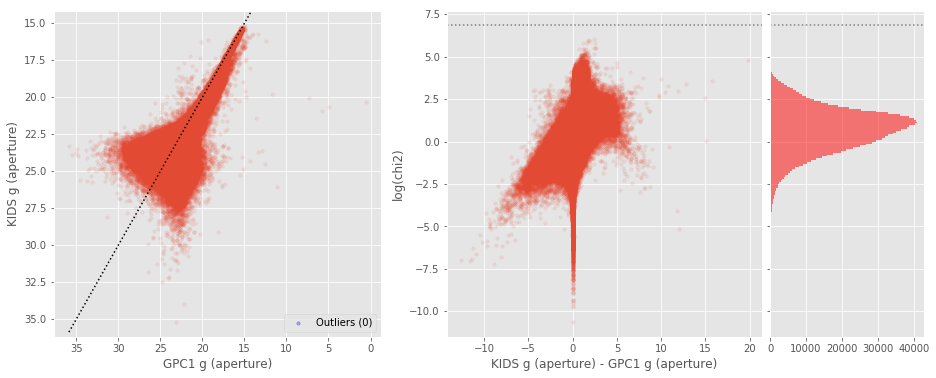

KIDS g (total) - GPC1 g (total) (1102188 sources):
- Median: 0.12
- Median Absolute Deviation: 0.25
- 1% percentile: -1.596266613006592
- 99% percentile: 3.3798369407653777
Outliers separation: log(chi2) = 5.44
Number of outliers: 7



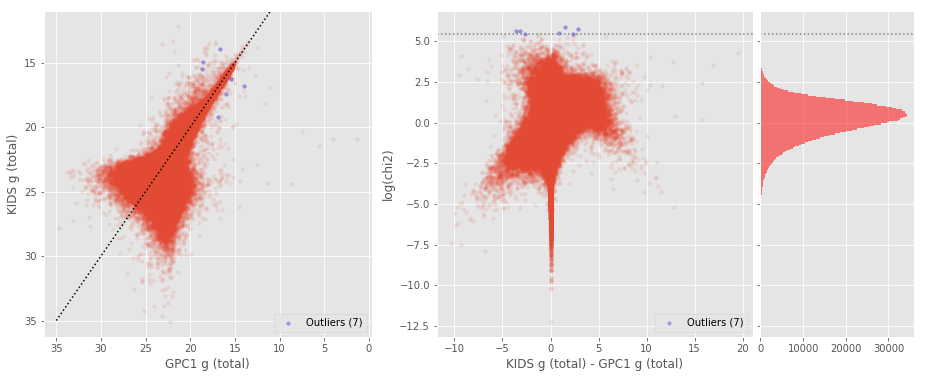

SUPRIME g (aperture) - GPC1 g (aperture) (229185 sources):
- Median: 0.33
- Median Absolute Deviation: 0.40
- 1% percentile: -2.283057327270508
- 99% percentile: 3.0280526733398463
Outliers separation: log(chi2) = 6.58
Number of outliers: 0



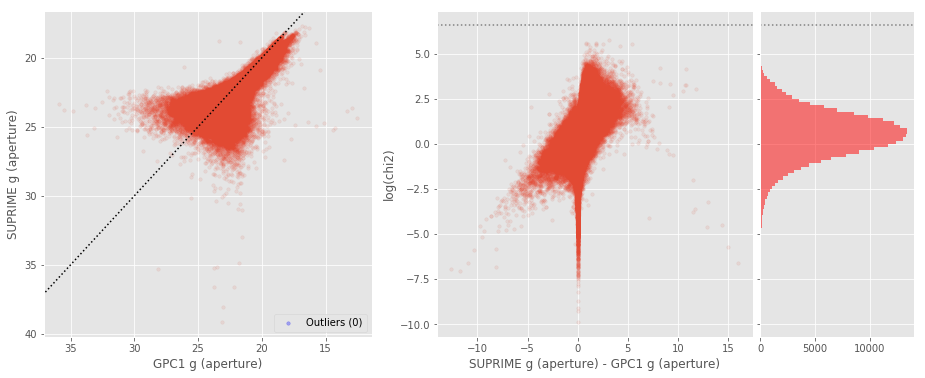

No sources have both GPC1 g (total) and SUPRIME g (total) values.

SUPRIME g (aperture) - KIDS g (aperture) (1275606 sources):
- Median: -0.10
- Median Absolute Deviation: 0.17
- 1% percentile: -1.7694091796874998
- 99% percentile: 1.1416382789611785
Outliers separation: log(chi2) = 4.05
Number of outliers: 307



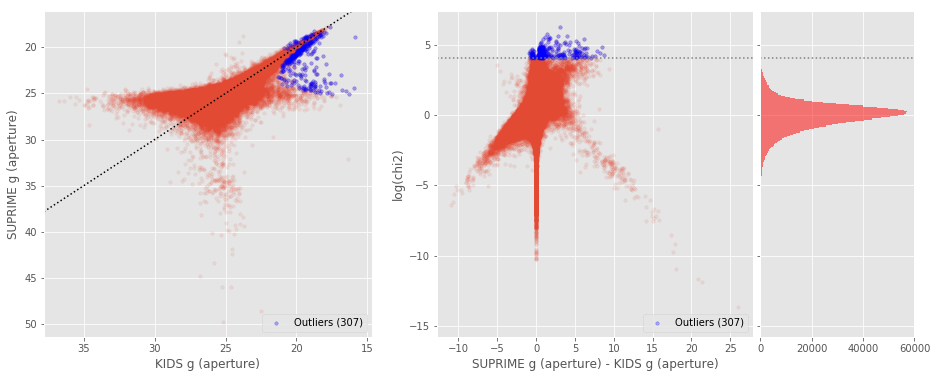

No sources have both KIDS g (total) and SUPRIME g (total) values.

GPC1 r (aperture) - DECam r (aperture) (701539 sources):
- Median: 0.10
- Median Absolute Deviation: 0.17
- 1% percentile: -2.1499901390075684
- 99% percentile: 1.7801751708984375
Outliers separation: log(chi2) = 4.79
Number of outliers: 4564



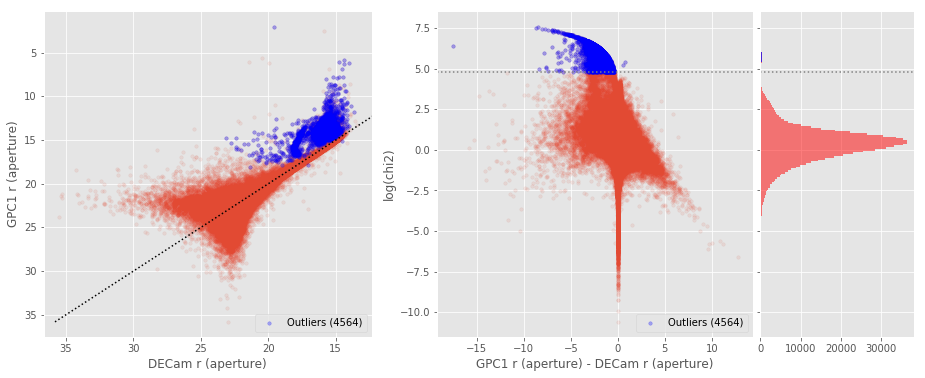

GPC1 r (total) - DECam r (total) (707841 sources):
- Median: 0.21
- Median Absolute Deviation: 0.15
- 1% percentile: -1.3948646545410157
- 99% percentile: 1.6864162445068303
Outliers separation: log(chi2) = 5.53
Number of outliers: 144



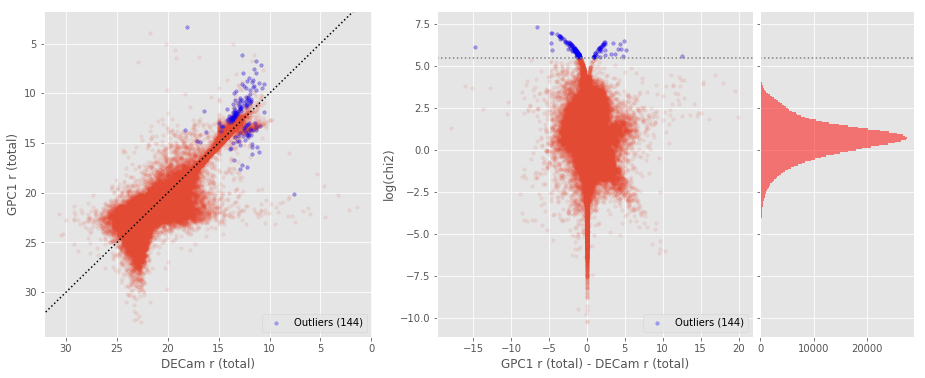

KIDS r (aperture) - DECam r (aperture) (2006568 sources):
- Median: 0.25
- Median Absolute Deviation: 0.24
- 1% percentile: -2.223689575195312
- 99% percentile: 1.2501894378662115
Outliers separation: log(chi2) = 6.41
Number of outliers: 0



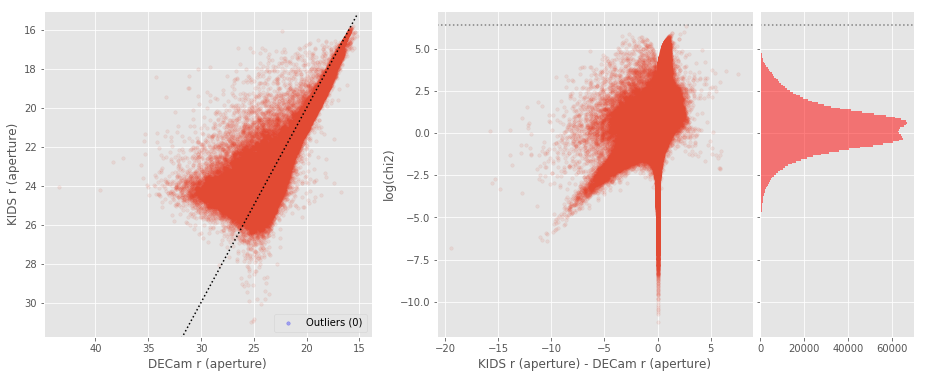

KIDS r (total) - DECam r (total) (2044991 sources):
- Median: 0.17
- Median Absolute Deviation: 0.18
- 1% percentile: -1.2137767791748046
- 99% percentile: 1.5382007598877045
Outliers separation: log(chi2) = 5.34
Number of outliers: 48



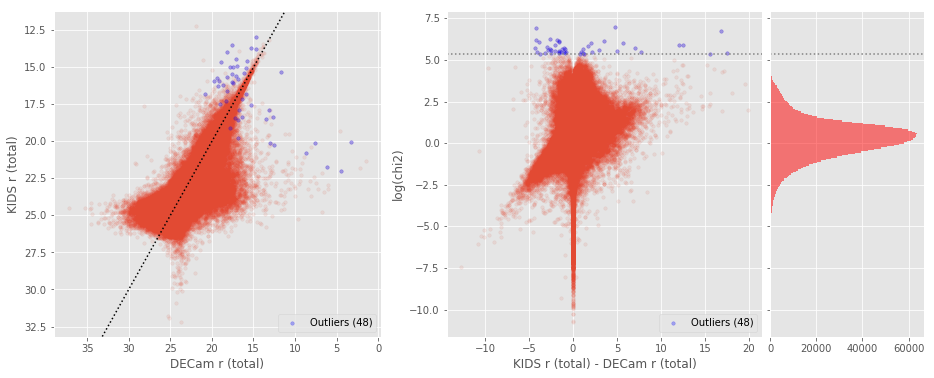

SUPRIME r (aperture) - DECam r (aperture) (573745 sources):
- Median: 0.19
- Median Absolute Deviation: 0.26
- 1% percentile: -2.5148622894287107
- 99% percentile: 1.5698329162597655
Outliers separation: log(chi2) = 6.11
Number of outliers: 3



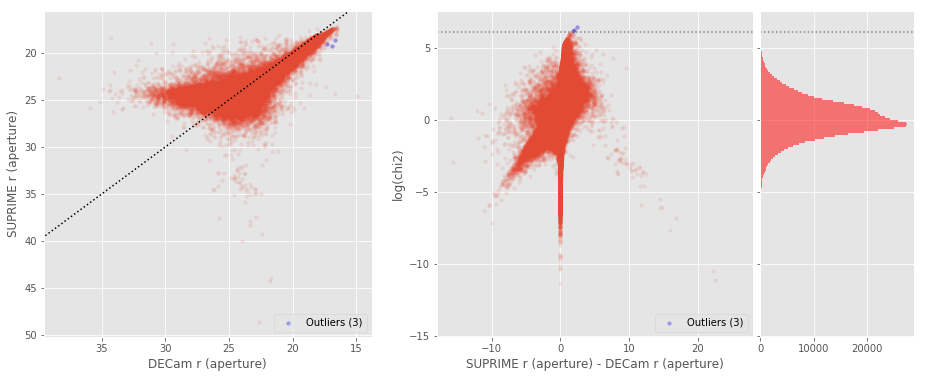

SUPRIME r (total) - DECam r (total) (582750 sources):
- Median: -0.00
- Median Absolute Deviation: 0.19
- 1% percentile: -1.8438292884826661
- 99% percentile: 1.7042069625854497
Outliers separation: log(chi2) = 4.43
Number of outliers: 587



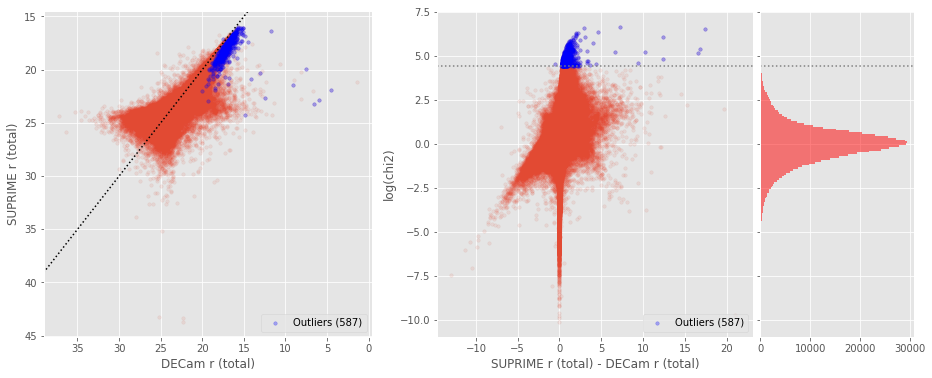

KIDS r (aperture) - GPC1 r (aperture) (1128466 sources):
- Median: 0.19
- Median Absolute Deviation: 0.24
- 1% percentile: -1.5094874382019041
- 99% percentile: 1.4279033660888736
Outliers separation: log(chi2) = 6.30
Number of outliers: 1



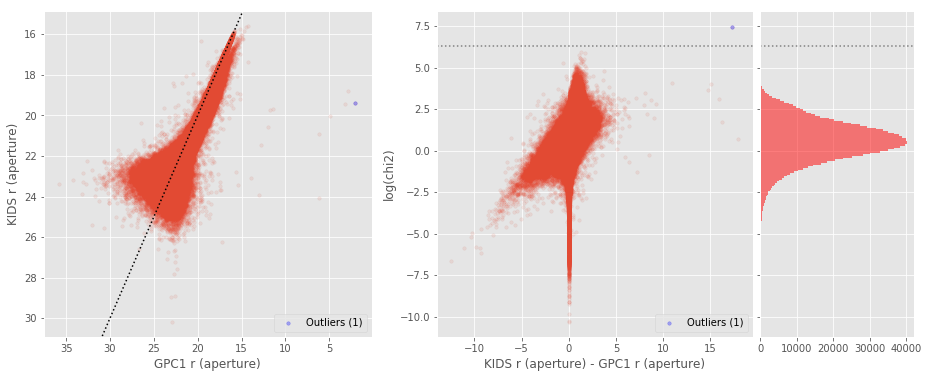

KIDS r (total) - GPC1 r (total) (1130805 sources):
- Median: -0.05
- Median Absolute Deviation: 0.13
- 1% percentile: -1.050480728149414
- 99% percentile: 1.5332369995117183
Outliers separation: log(chi2) = 4.78
Number of outliers: 15



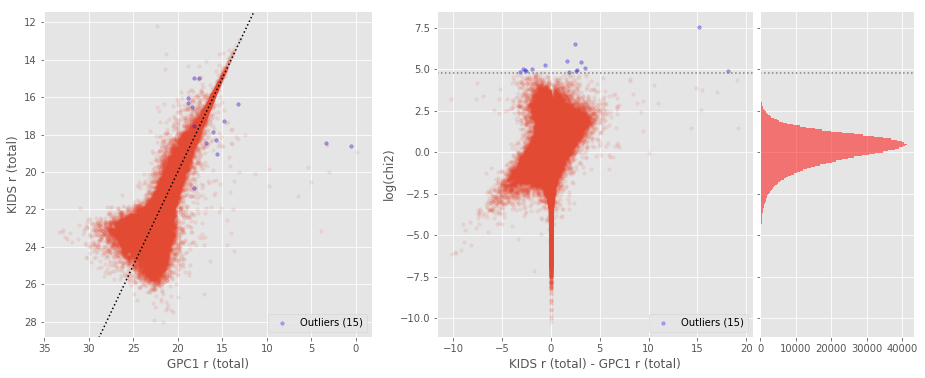

SUPRIME r (aperture) - GPC1 r (aperture) (239530 sources):
- Median: 0.16
- Median Absolute Deviation: 0.25
- 1% percentile: -1.5769341278076172
- 99% percentile: 1.6482121086120594
Outliers separation: log(chi2) = 6.16
Number of outliers: 1



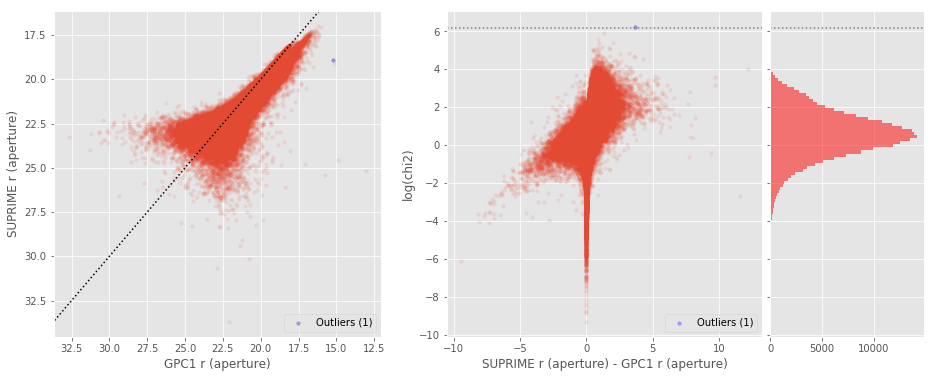

SUPRIME r (total) - GPC1 r (total) (239488 sources):
- Median: -0.14
- Median Absolute Deviation: 0.15
- 1% percentile: -1.1306134033203126
- 99% percentile: 1.601072483062745
Outliers separation: log(chi2) = 4.91
Number of outliers: 11



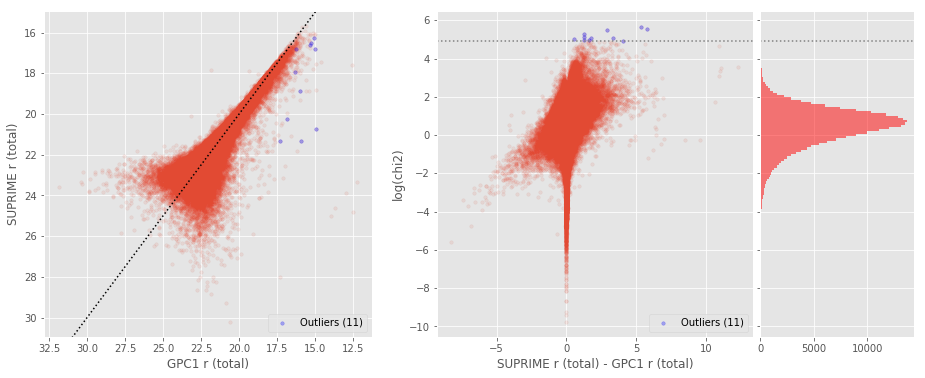

SUPRIME r (aperture) - KIDS r (aperture) (1375381 sources):
- Median: -0.04
- Median Absolute Deviation: 0.11
- 1% percentile: -0.8898246765136719
- 99% percentile: 0.9822139739990225
Outliers separation: log(chi2) = 4.20
Number of outliers: 299



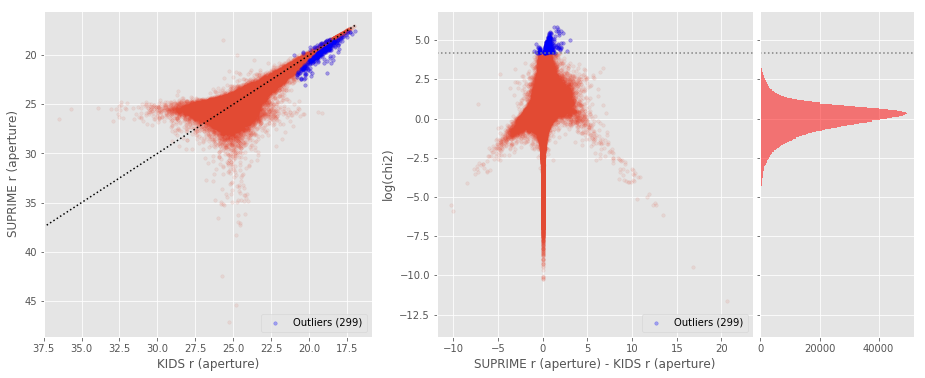

SUPRIME r (total) - KIDS r (total) (1341990 sources):
- Median: -0.21
- Median Absolute Deviation: 0.19
- 1% percentile: -1.4218847465515136
- 99% percentile: 1.2361030578613281
Outliers separation: log(chi2) = 4.46
Number of outliers: 920



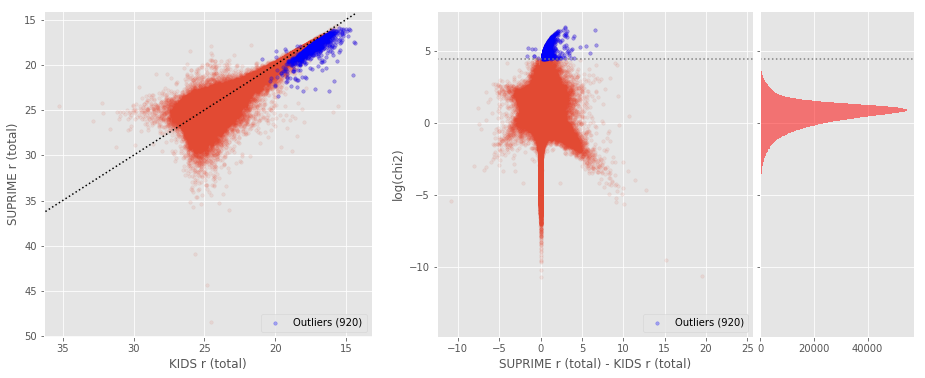

KIDS i (aperture) - GPC1 i (aperture) (1152951 sources):
- Median: 0.15
- Median Absolute Deviation: 0.19
- 1% percentile: -0.942601203918457
- 99% percentile: 1.0921630859375
Outliers separation: log(chi2) = 6.08
Number of outliers: 1



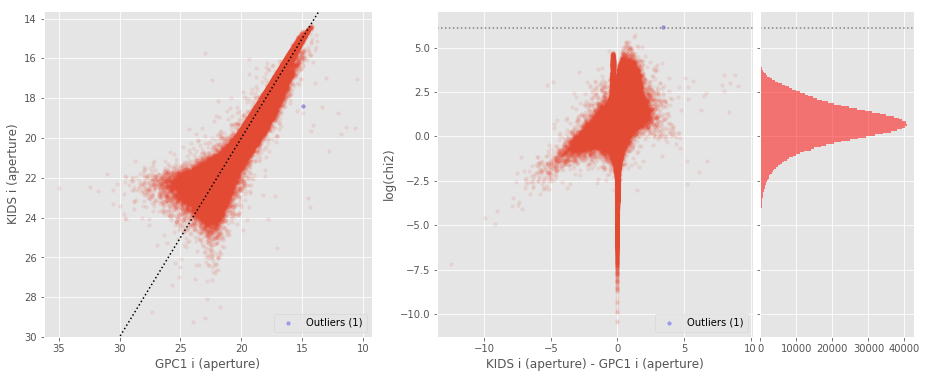

KIDS i (total) - GPC1 i (total) (1154134 sources):
- Median: -0.04
- Median Absolute Deviation: 0.12
- 1% percentile: -0.728927001953125
- 99% percentile: 0.9394100379943815
Outliers separation: log(chi2) = 4.74
Number of outliers: 37



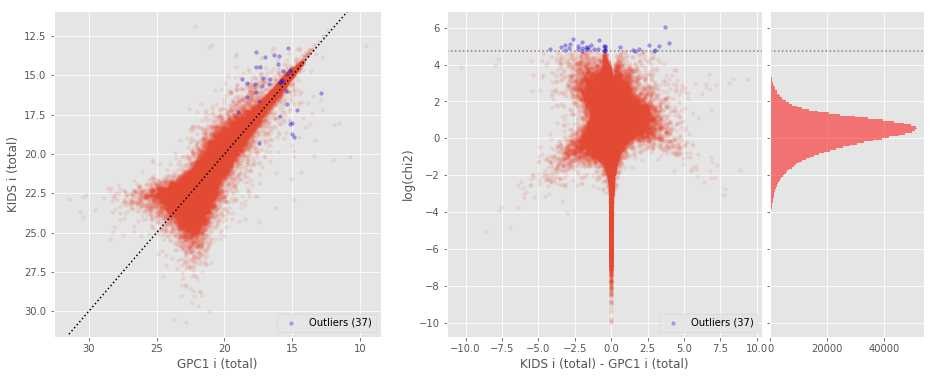

SUPRIME i (aperture) - GPC1 i (aperture) (242138 sources):
- Median: 0.09
- Median Absolute Deviation: 0.20
- 1% percentile: -0.9451054382324219
- 99% percentile: 1.259707469940188
Outliers separation: log(chi2) = 6.21
Number of outliers: 0



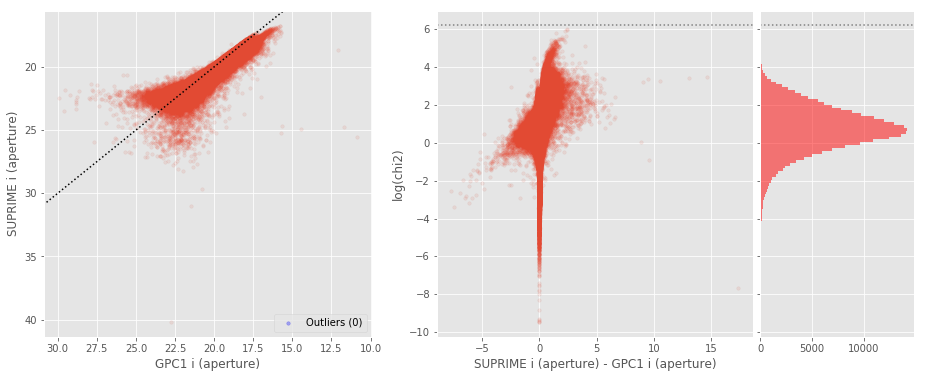

SUPRIME i (total) - GPC1 i (total) (241710 sources):
- Median: -0.20
- Median Absolute Deviation: 0.12
- 1% percentile: -0.7898097038269043
- 99% percentile: 0.9388395690917972
Outliers separation: log(chi2) = 4.79
Number of outliers: 58



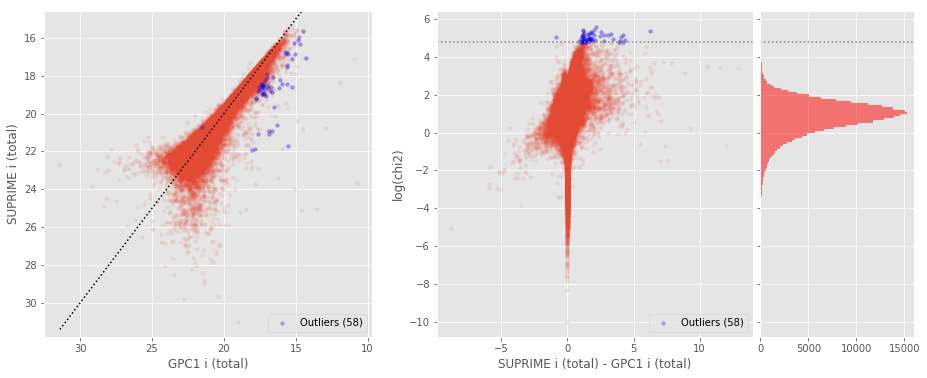

SUPRIME i (aperture) - KIDS i (aperture) (1188442 sources):
- Median: -0.08
- Median Absolute Deviation: 0.21
- 1% percentile: -2.09933012008667
- 99% percentile: 1.3187010002136277
Outliers separation: log(chi2) = 4.54
Number of outliers: 649



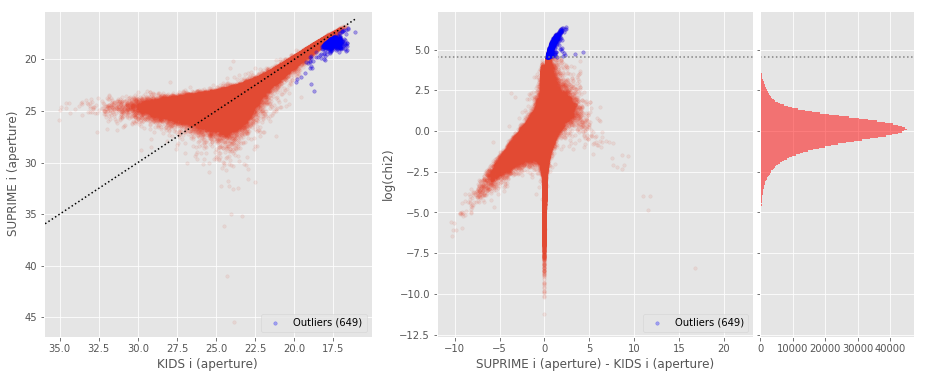

SUPRIME i (total) - KIDS i (total) (1179581 sources):
- Median: -0.30
- Median Absolute Deviation: 0.30
- 1% percentile: -3.1144371032714844
- 99% percentile: 1.373026657104492
Outliers separation: log(chi2) = 4.38
Number of outliers: 944



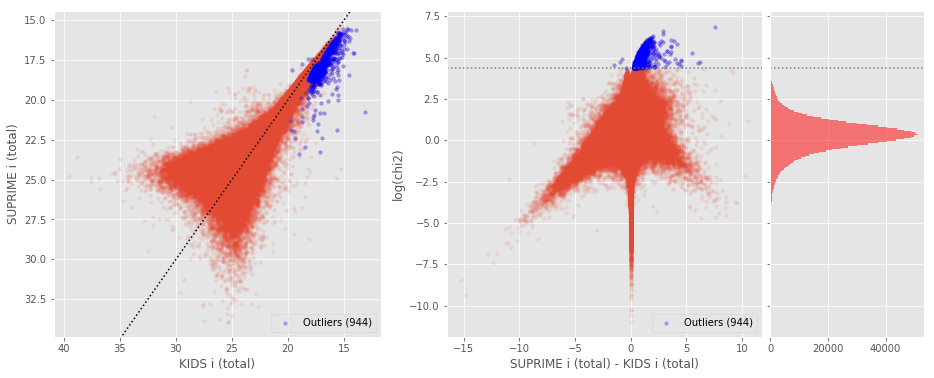

GPC1 z (aperture) - DECam z (aperture) (1172443 sources):
- Median: 0.13
- Median Absolute Deviation: 0.12
- 1% percentile: -1.197961082458496
- 99% percentile: 1.1379787445068388
Outliers separation: log(chi2) = 5.13
Number of outliers: 9897



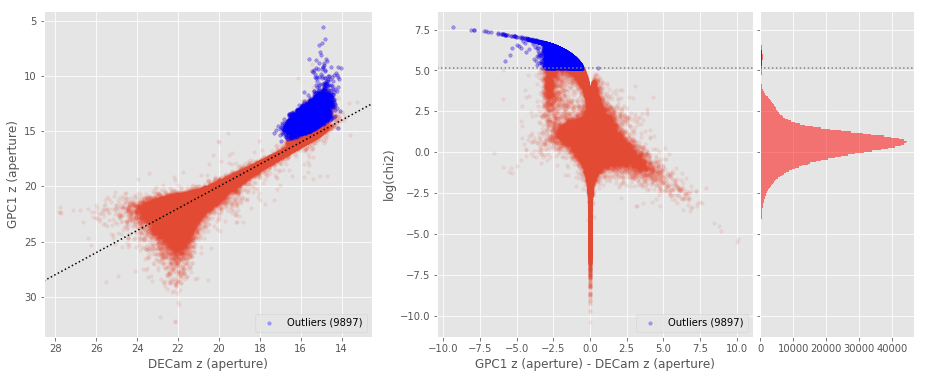

GPC1 z (total) - DECam z (total) (1172495 sources):
- Median: 0.25
- Median Absolute Deviation: 0.12
- 1% percentile: -0.7122621345520018
- 99% percentile: 1.3096992492675792
Outliers separation: log(chi2) = 5.84
Number of outliers: 109



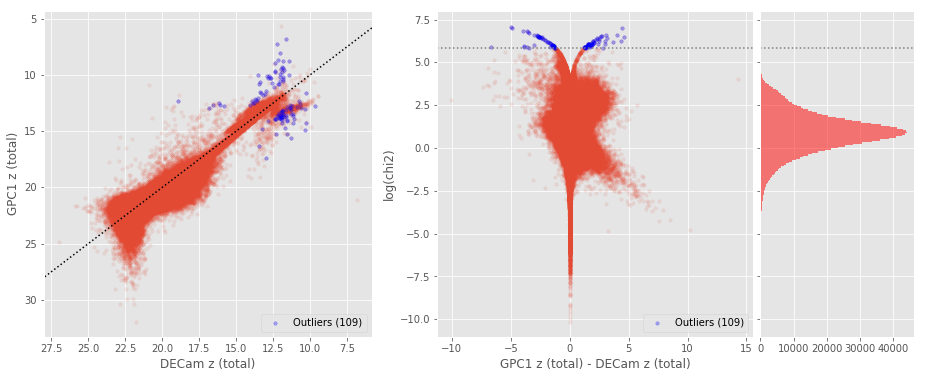

SUPRIME z (aperture) - DECam z (aperture) (774796 sources):
- Median: 0.14
- Median Absolute Deviation: 0.20
- 1% percentile: -1.7197685241699219
- 99% percentile: 1.3337068557739267
Outliers separation: log(chi2) = 6.63
Number of outliers: 0



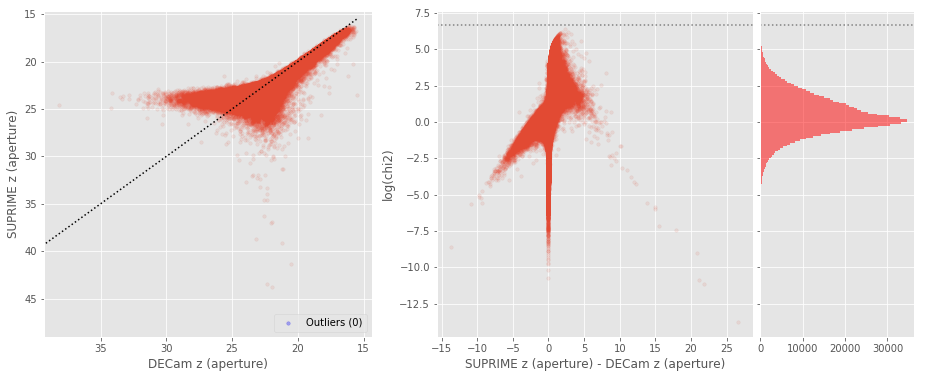

SUPRIME z (total) - DECam z (total) (775148 sources):
- Median: 0.02
- Median Absolute Deviation: 0.14
- 1% percentile: -0.8981622886657715
- 99% percentile: 1.4719318771362397
Outliers separation: log(chi2) = 5.15
Number of outliers: 489



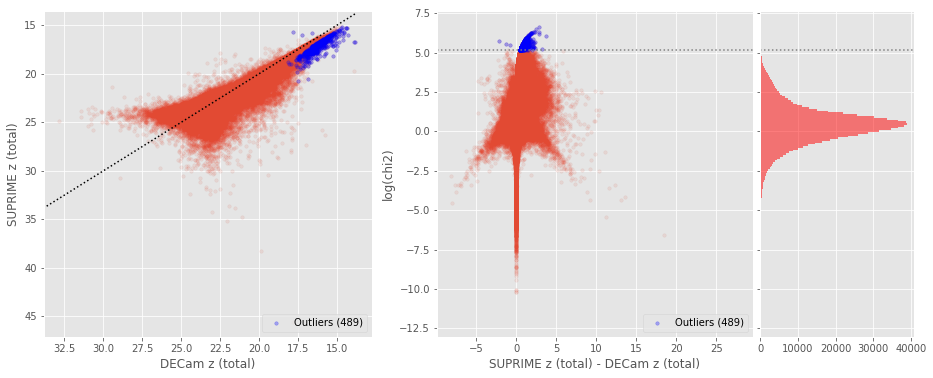

VIRCAM Z (aperture) - DECam z (aperture) (1572310 sources):
- Median: 0.23
- Median Absolute Deviation: 0.17
- 1% percentile: -1.0402620697021485
- 99% percentile: 0.8522775840759276
Outliers separation: log(chi2) = 6.08
Number of outliers: 5959



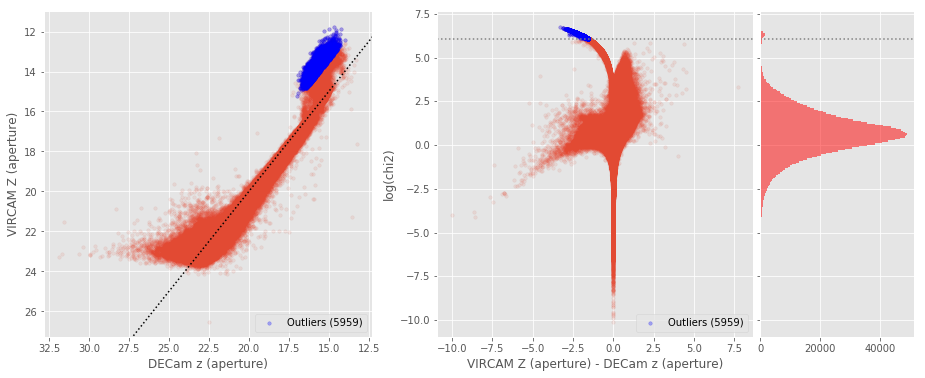

VIRCAM Z (total) - DECam z (total) (1572873 sources):
- Median: 0.12
- Median Absolute Deviation: 0.19
- 1% percentile: -0.927515640258789
- 99% percentile: 1.4494478607177737
Outliers separation: log(chi2) = 4.34
Number of outliers: 5740



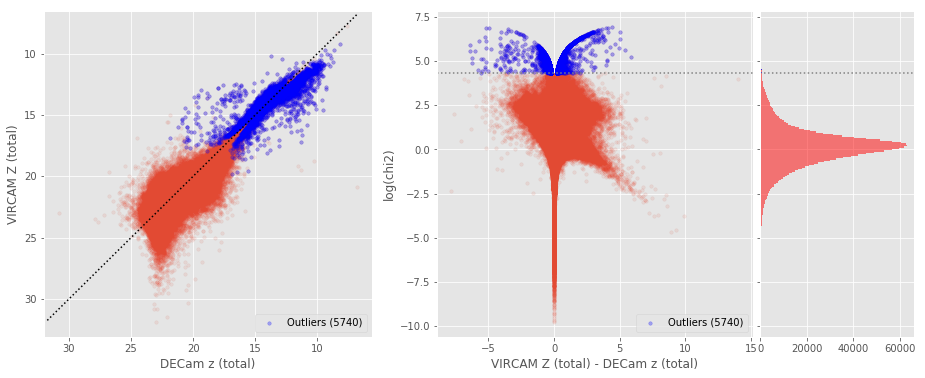

SUPRIME z (aperture) - GPC1 z (aperture) (241905 sources):
- Median: 0.11
- Median Absolute Deviation: 0.21
- 1% percentile: -1.0268697357177734
- 99% percentile: 1.1804688262939451
Outliers separation: log(chi2) = 6.05
Number of outliers: 0



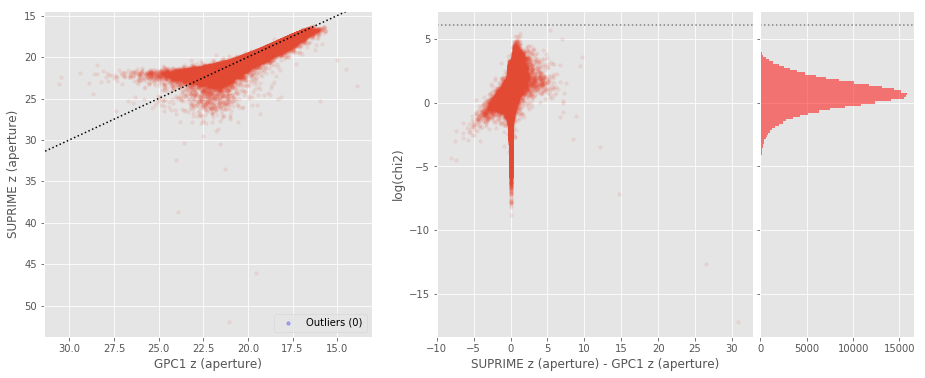

SUPRIME z (total) - GPC1 z (total) (241427 sources):
- Median: -0.17
- Median Absolute Deviation: 0.13
- 1% percentile: -0.857375373840332
- 99% percentile: 0.9890042114257804
Outliers separation: log(chi2) = 4.94
Number of outliers: 12



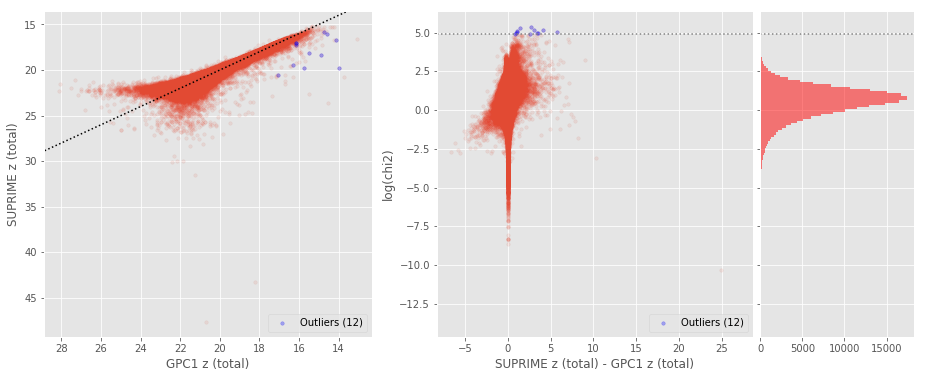

VIRCAM Z (aperture) - GPC1 z (aperture) (861809 sources):
- Median: 0.11
- Median Absolute Deviation: 0.20
- 1% percentile: -0.970911102294922
- 99% percentile: 0.9725391387939457
Outliers separation: log(chi2) = 5.78
Number of outliers: 155



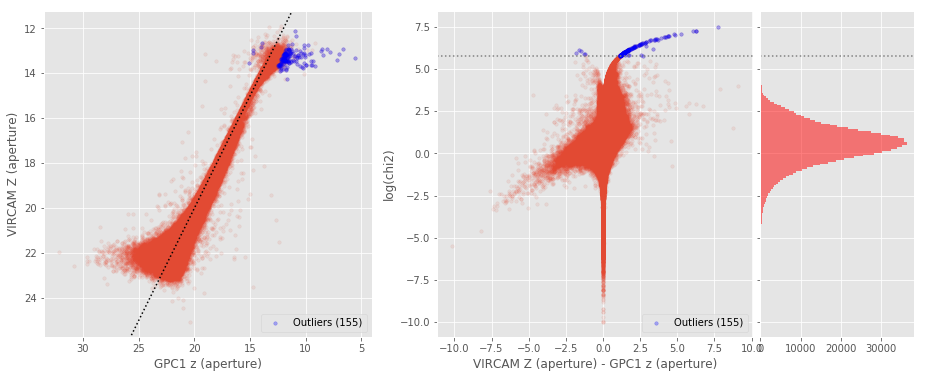

VIRCAM Z (total) - GPC1 z (total) (861894 sources):
- Median: -0.14
- Median Absolute Deviation: 0.16
- 1% percentile: -1.0643985748291016
- 99% percentile: 1.145026283264158
Outliers separation: log(chi2) = 5.36
Number of outliers: 231



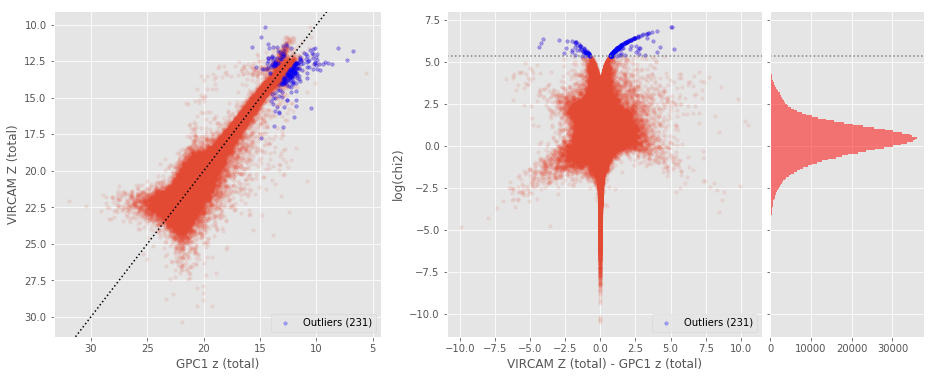

VIRCAM Z (aperture) - SUPRIME z (aperture) (362843 sources):
- Median: 0.03
- Median Absolute Deviation: 0.08
- 1% percentile: -2.354428024291992
- 99% percentile: 0.4706958389282233
Outliers separation: log(chi2) = 4.17
Number of outliers: 92



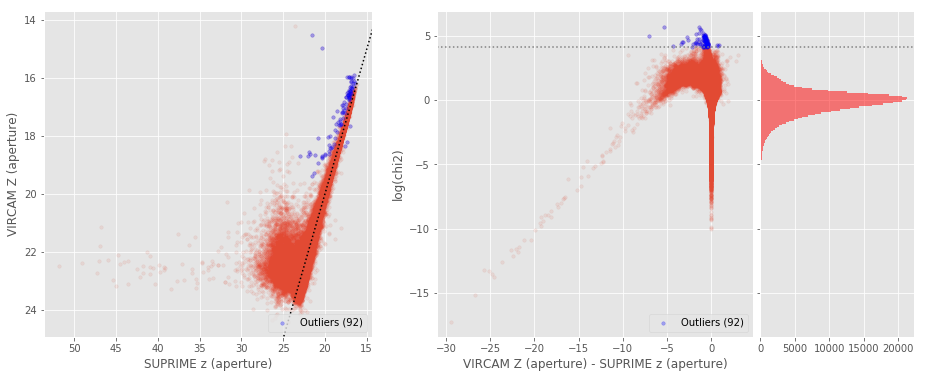

VIRCAM Z (total) - SUPRIME z (total) (360604 sources):
- Median: 0.05
- Median Absolute Deviation: 0.21
- 1% percentile: -2.26505313873291
- 99% percentile: 1.272478179931639
Outliers separation: log(chi2) = 3.96
Number of outliers: 395



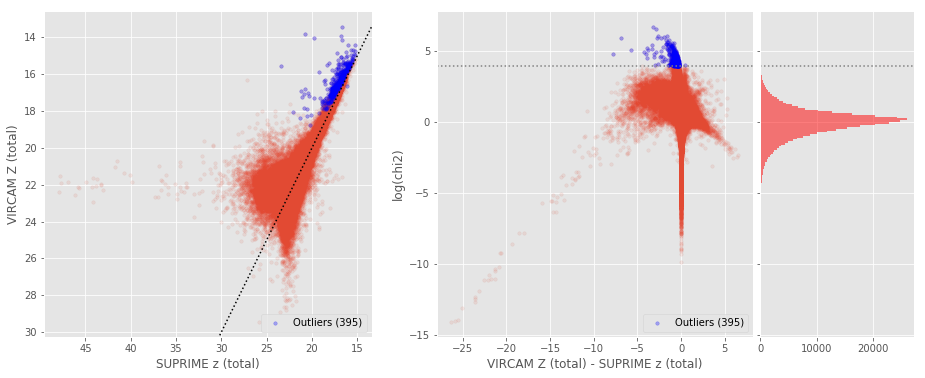

SUPRIME y (aperture) - GPC1 y (aperture) (237306 sources):
- Median: 0.27
- Median Absolute Deviation: 0.32
- 1% percentile: -1.805854034423828
- 99% percentile: 1.9547522544860843
Outliers separation: log(chi2) = 5.92
Number of outliers: 0



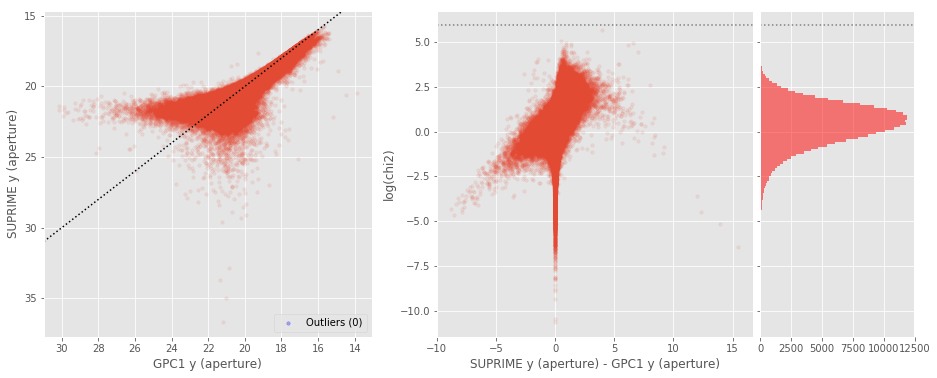

SUPRIME y (total) - GPC1 y (total) (233759 sources):
- Median: -0.07
- Median Absolute Deviation: 0.27
- 1% percentile: -1.7523292541503905
- 99% percentile: 2.125194244384766
Outliers separation: log(chi2) = 5.31
Number of outliers: 2



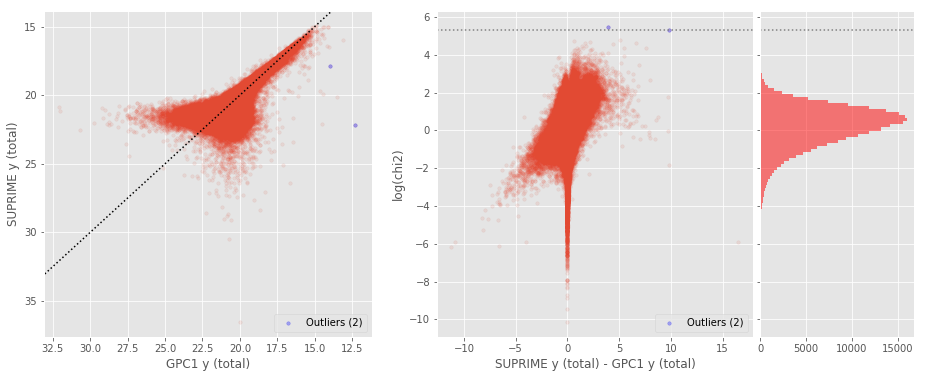

VIRCAM Y (aperture) - GPC1 y (aperture) (763340 sources):
- Median: 0.13
- Median Absolute Deviation: 0.26
- 1% percentile: -1.6570987701416016
- 99% percentile: 1.4982933616638172
Outliers separation: log(chi2) = 5.49
Number of outliers: 144



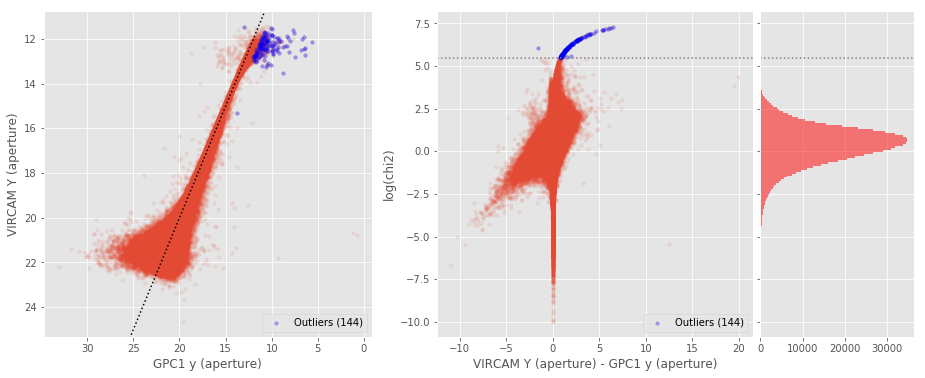

VIRCAM Y (total) - GPC1 y (total) (756676 sources):
- Median: -0.16
- Median Absolute Deviation: 0.26
- 1% percentile: -1.6200227737426758
- 99% percentile: 1.941950798034668
Outliers separation: log(chi2) = 5.35
Number of outliers: 110



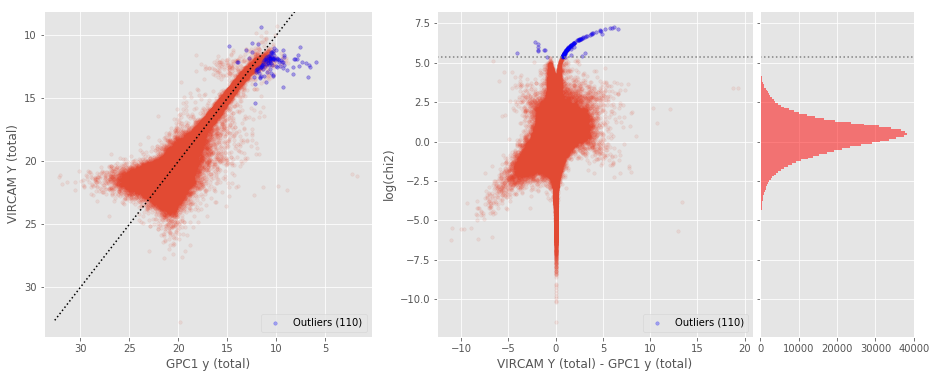

WFCAM Y (aperture) - GPC1 y (aperture) (371718 sources):
- Median: 0.12
- Median Absolute Deviation: 0.20
- 1% percentile: -0.9868251037597656
- 99% percentile: 1.1779327392578156
Outliers separation: log(chi2) = 5.19
Number of outliers: 132



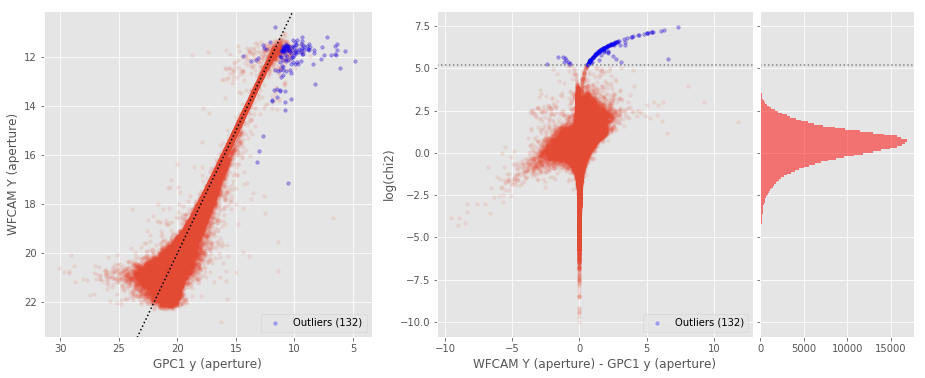

WFCAM Y (total) - GPC1 y (total) (371145 sources):
- Median: -0.08
- Median Absolute Deviation: 0.15
- 1% percentile: -1.0677397155761719
- 99% percentile: 1.2397575378417969
Outliers separation: log(chi2) = 4.71
Number of outliers: 158



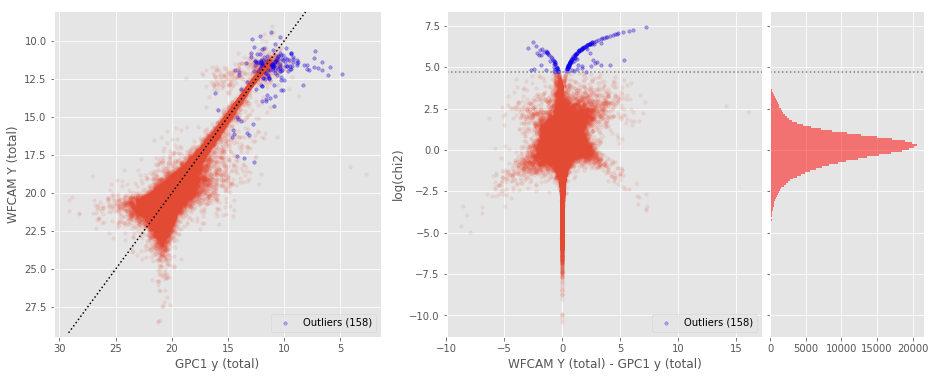

VIRCAM Y (aperture) - SUPRIME y (aperture) (195972 sources):
- Median: -0.08
- Median Absolute Deviation: 0.08
- 1% percentile: -2.3390107727050777
- 99% percentile: 0.3541413497924807
Outliers separation: log(chi2) = 5.02
Number of outliers: 5



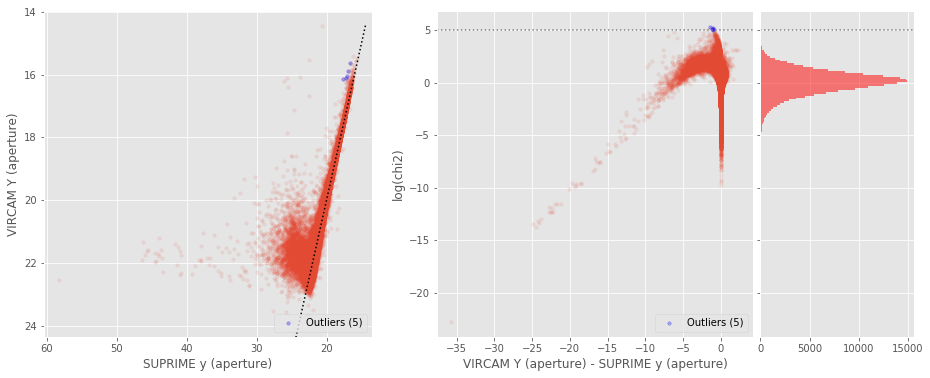

VIRCAM Y (total) - SUPRIME y (total) (194971 sources):
- Median: -0.05
- Median Absolute Deviation: 0.20
- 1% percentile: -1.9368417739868162
- 99% percentile: 1.0745662689208972
Outliers separation: log(chi2) = 4.46
Number of outliers: 62



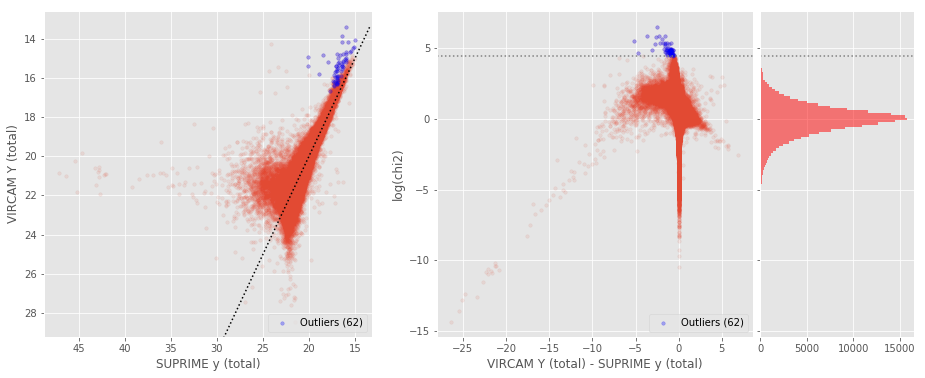

WFCAM Y (aperture) - SUPRIME y (aperture) (60378 sources):
- Median: 0.00
- Median Absolute Deviation: 0.11
- 1% percentile: -5.1138330078125005
- 99% percentile: 0.6741067123413076
Outliers separation: log(chi2) = 4.39
Number of outliers: 9



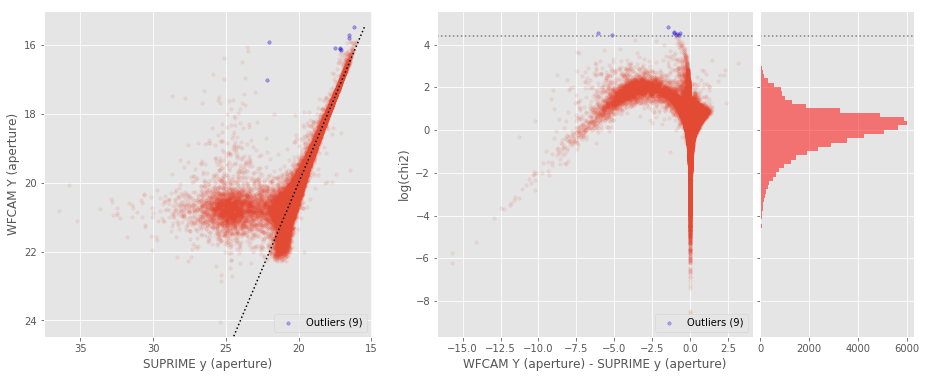

WFCAM Y (total) - SUPRIME y (total) (59786 sources):
- Median: 0.05
- Median Absolute Deviation: 0.17
- 1% percentile: -4.655880737304687
- 99% percentile: 1.119536209106446
Outliers separation: log(chi2) = 4.24
Number of outliers: 16



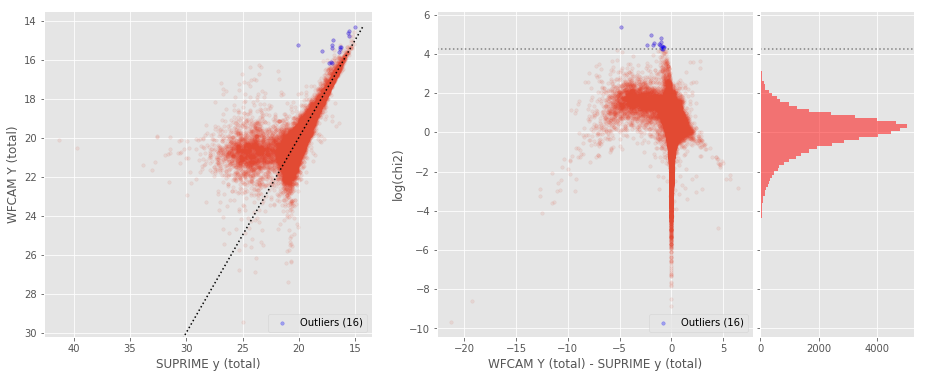

WFCAM Y (aperture) - VIRCAM Y (aperture) (273416 sources):
- Median: 0.09
- Median Absolute Deviation: 0.08
- 1% percentile: -0.5362713813781738
- 99% percentile: 0.7096179962158198
Outliers separation: log(chi2) = 4.55
Number of outliers: 1102



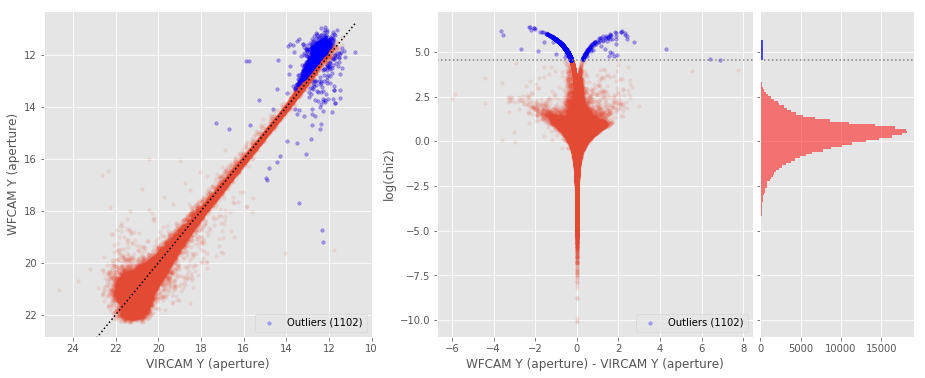

WFCAM Y (total) - VIRCAM Y (total) (273288 sources):
- Median: 0.13
- Median Absolute Deviation: 0.16
- 1% percentile: -1.0093192100524904
- 99% percentile: 1.2563526535034186
Outliers separation: log(chi2) = 5.00
Number of outliers: 544



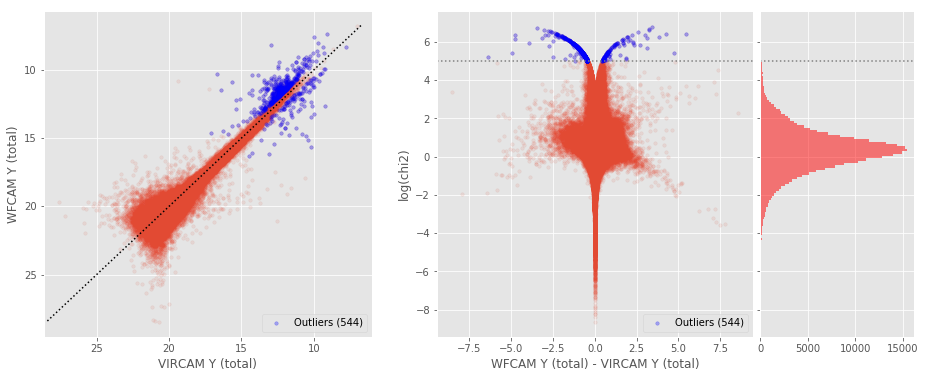

In [26]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        if basecol1 == "kids_i" and basecol2 == "suprime_i":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        ecol1, ecol2 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2],
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)
        
        # Tot mag
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        ecol1, ecol2 = "merr_{}".format(basecol1), "merr_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2], 
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (total)".format(band1), "{} (total)".format(band2)))
        
plt.close() 
plt.close()
plt.close()

## 4/ Aperture correction issues

In [27]:
def apcor_check(x, y, stellarity, labels=["x", "y"], savefig=False):
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    #fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))   # 
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(stellarity)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    stellarity = np.copy(stellarity[mask])


    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    
    diff_label = "{} - {}".format(y_label, x_label)
    print("{}:".format(diff_label))
    
    # Subsample
    zoom = (x > 16) & (x < 20)


    # Comparing mag
    ax1.scatter(x, diff, marker='.', alpha=0.1, s=50)
    ax1.invert_xaxis()
    ax1.set_ylabel(diff_label)
    ax1.set_xlabel(x_label)
    

    # Zoom Plot
    y_min, y_max = np.percentile(diff[zoom], [1., 99.])
    y_delta = .1 * (y_max - y_min)
    y_min -= y_delta
    y_max += y_delta

    if len(x[zoom]) < 1000:
        alpha = 0.4
    else:
        alpha = 0.1
    print(len(x[zoom]))
    pl = ax2.scatter(x[zoom], diff[zoom], marker='.', alpha=alpha, s=50, c=stellarity[zoom], cmap="jet")
    ax2.invert_xaxis()
    ax2.set_ylabel(diff_label)
    ax2.set_xlabel(x_label)
    ax2.set_ylim([y_min, y_max])
    fig.colorbar(pl, label="stellarity (1=star)")
    
    #ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(diff[zoom], ax=ax3, bins='knuth', facecolor='black', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_apcorrIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

GPC1 g (aperture) - DECam g (aperture):
52637


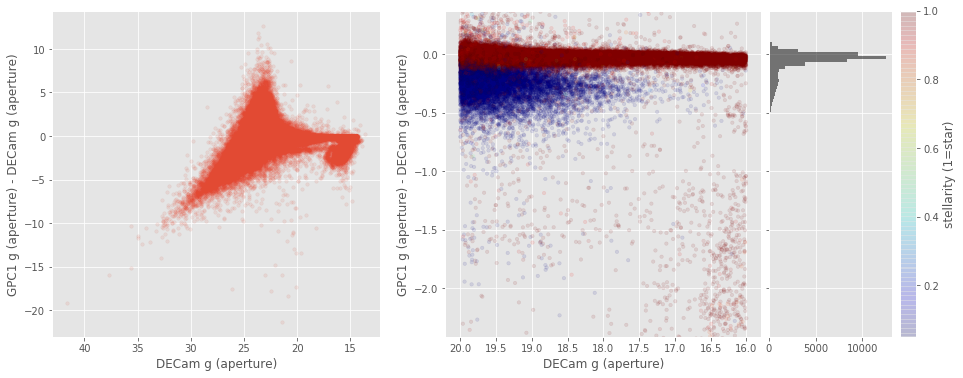

KIDS g (aperture) - DECam g (aperture):
49575


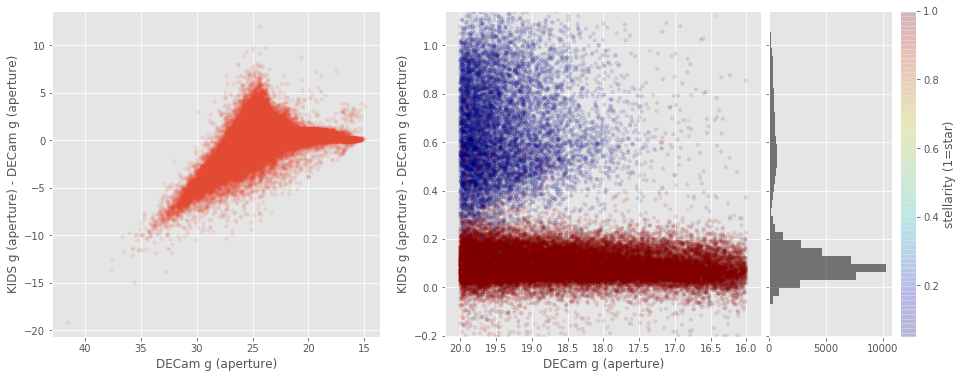

SUPRIME g (aperture) - DECam g (aperture):
7321


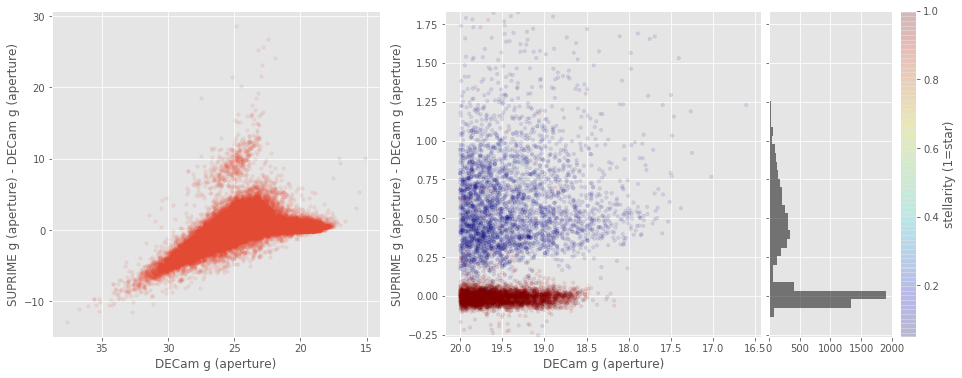

KIDS g (aperture) - GPC1 g (aperture):
95518


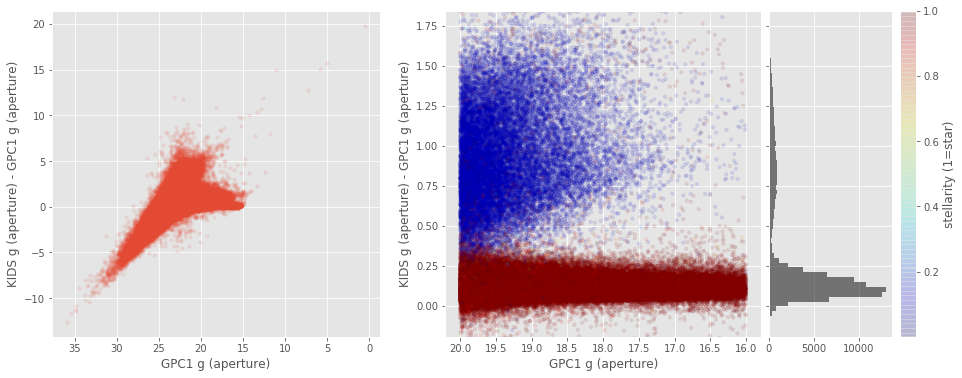

SUPRIME g (aperture) - GPC1 g (aperture):
10707


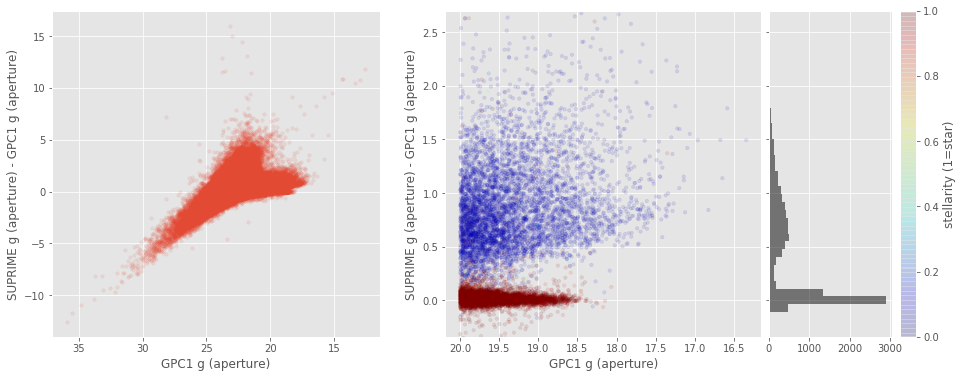

SUPRIME g (aperture) - KIDS g (aperture):
6201


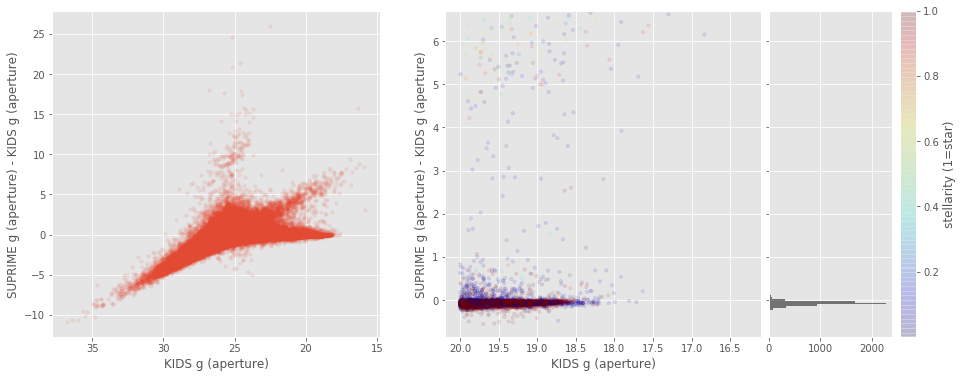

GPC1 r (aperture) - DECam r (aperture):
101647


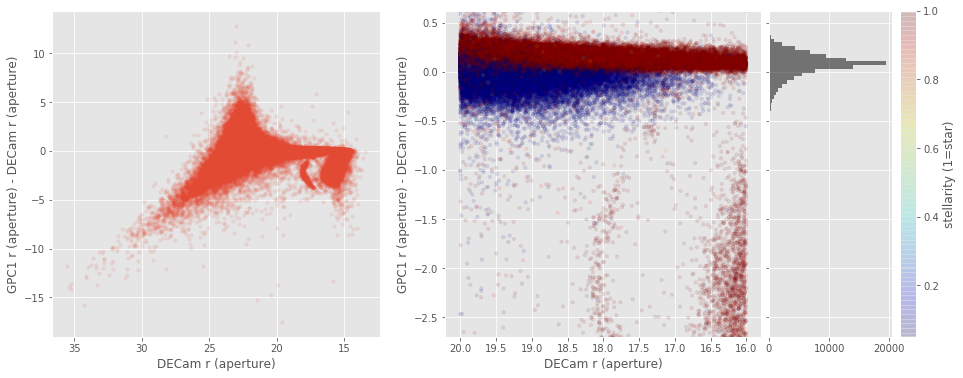

KIDS r (aperture) - DECam r (aperture):
88916


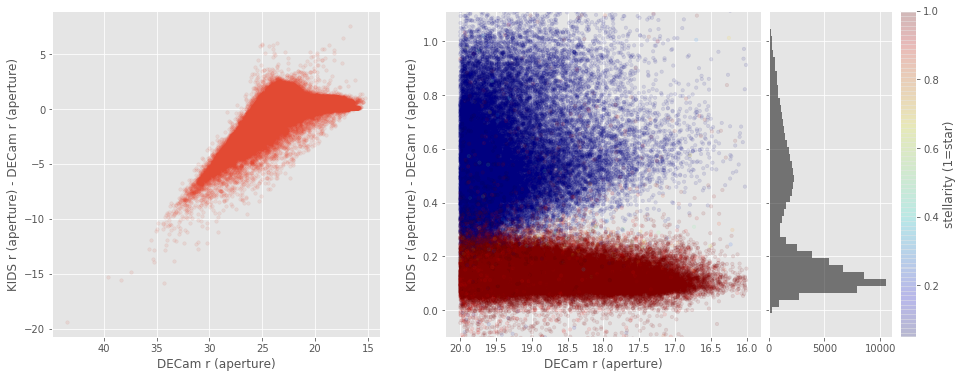

SUPRIME r (aperture) - DECam r (aperture):
19142


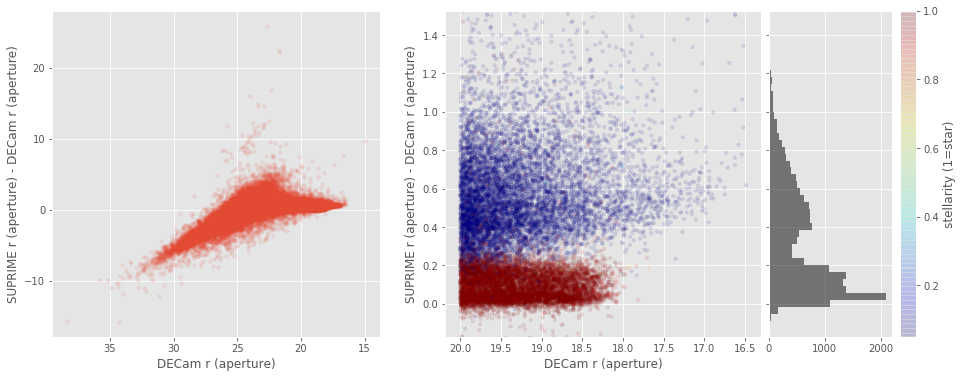

KIDS r (aperture) - GPC1 r (aperture):
149311


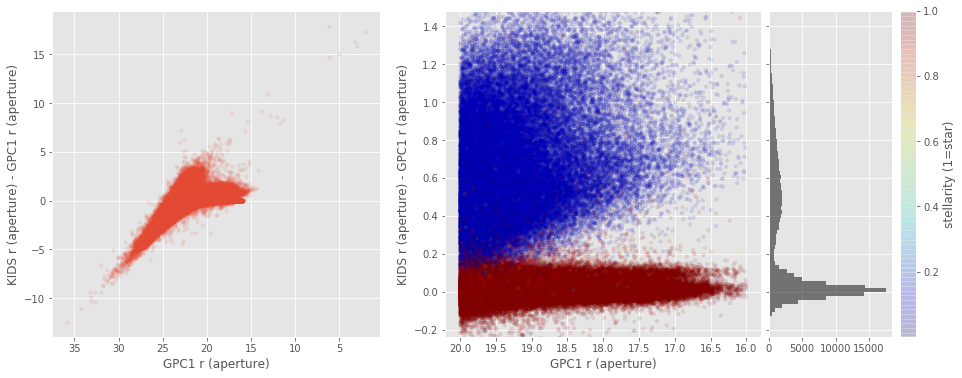

SUPRIME r (aperture) - GPC1 r (aperture):
25197


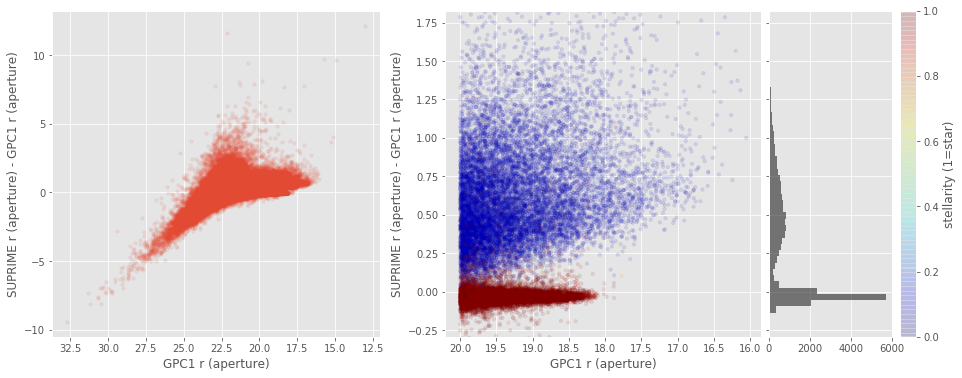

SUPRIME r (aperture) - KIDS r (aperture):
18545


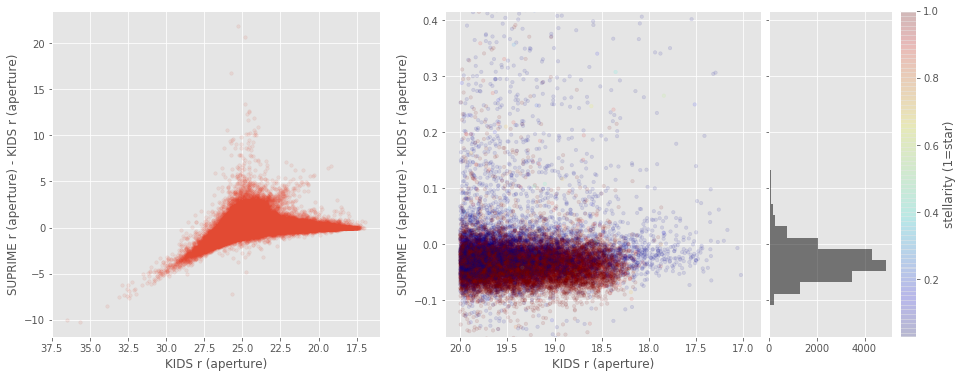

KIDS i (aperture) - GPC1 i (aperture):
234750


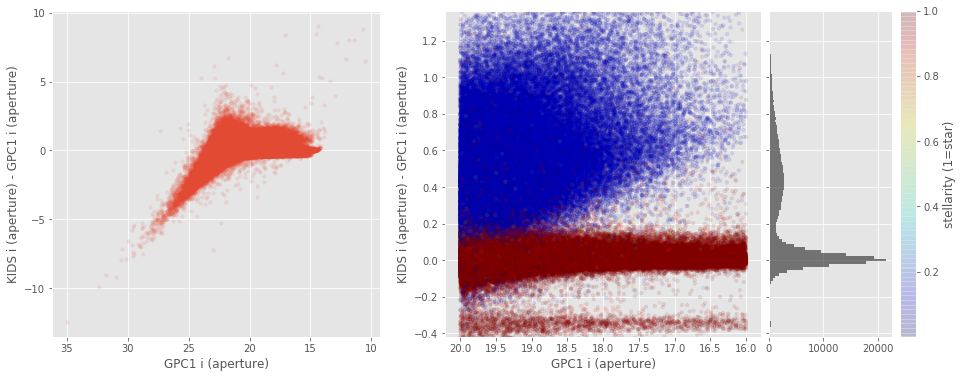

SUPRIME i (aperture) - GPC1 i (aperture):
41095


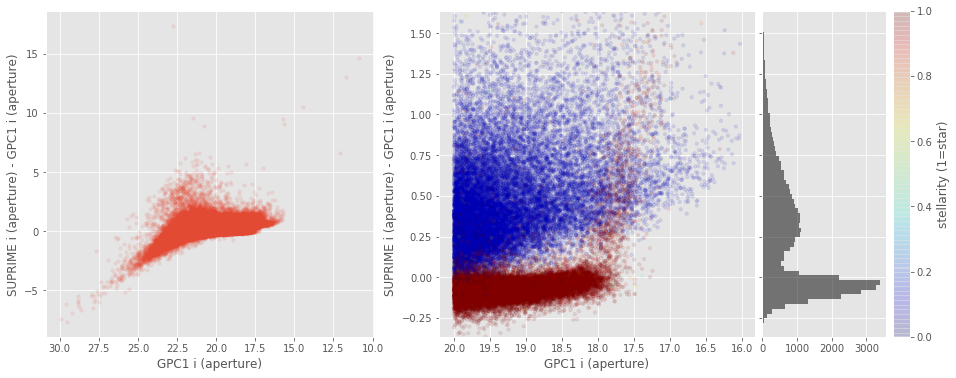

SUPRIME i (aperture) - KIDS i (aperture):
32990


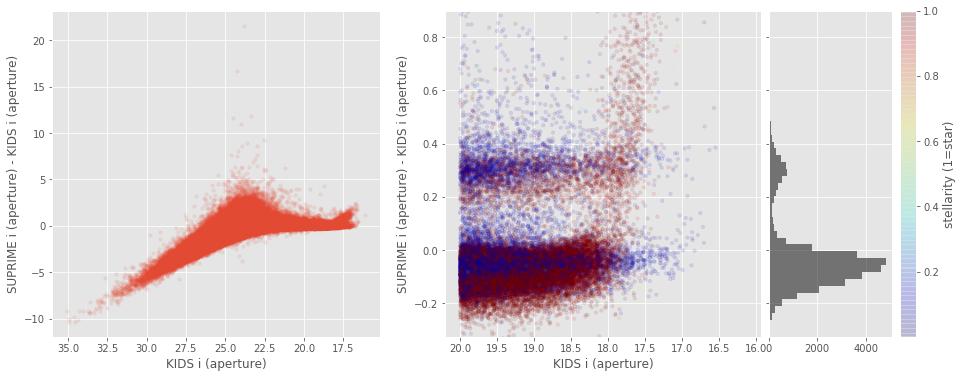

GPC1 z (aperture) - DECam z (aperture):
329913


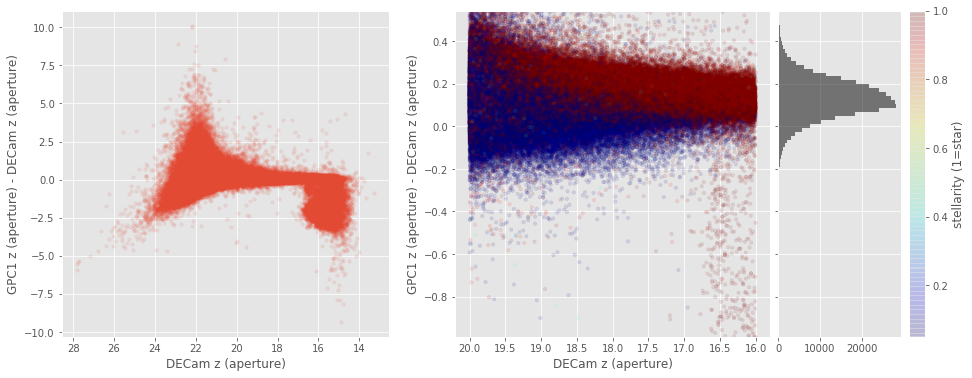

SUPRIME z (aperture) - DECam z (aperture):
60228


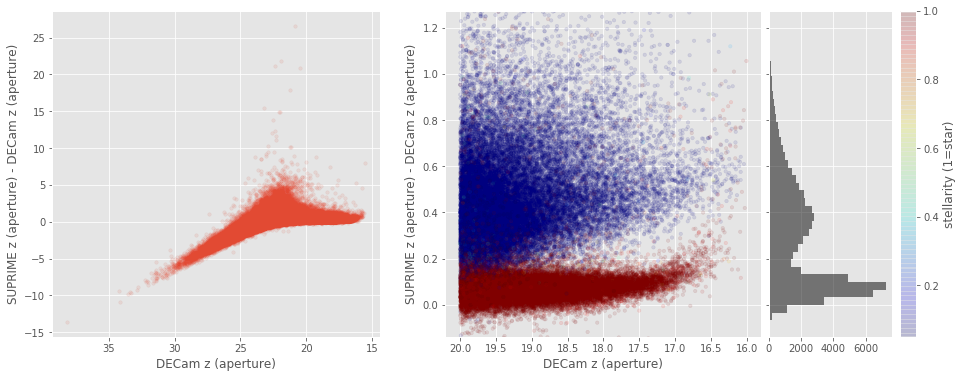

VIRCAM Z (aperture) - DECam z (aperture):
236902


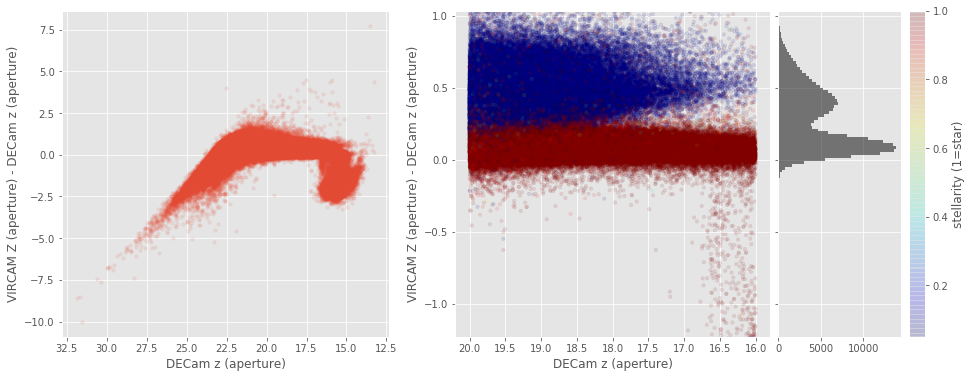

SUPRIME z (aperture) - GPC1 z (aperture):
53922


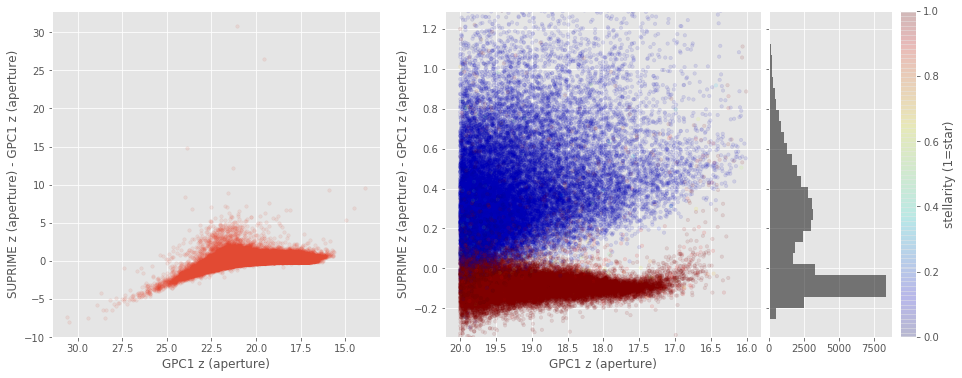

VIRCAM Z (aperture) - GPC1 z (aperture):
217185


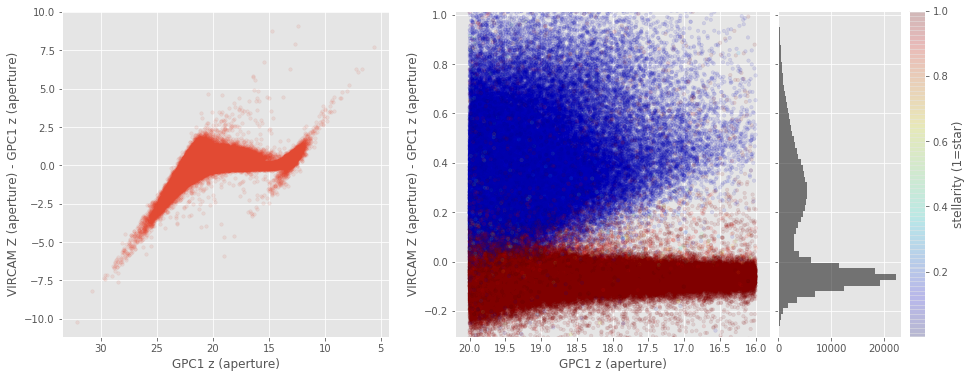

VIRCAM Z (aperture) - SUPRIME z (aperture):
32101


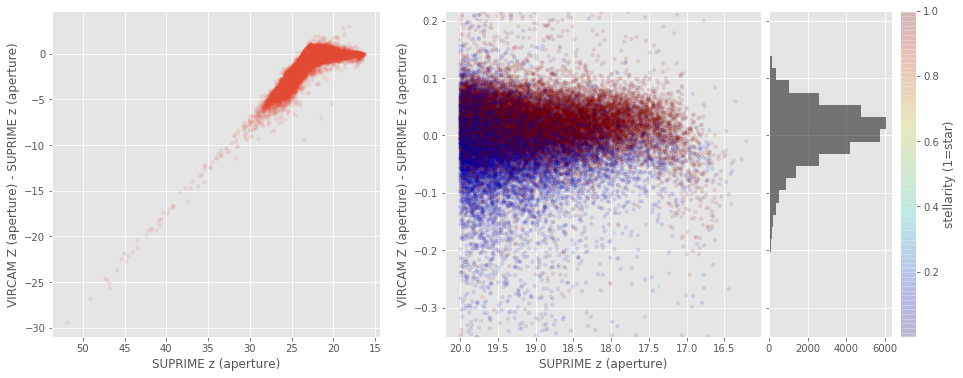

SUPRIME y (aperture) - GPC1 y (aperture):
67184


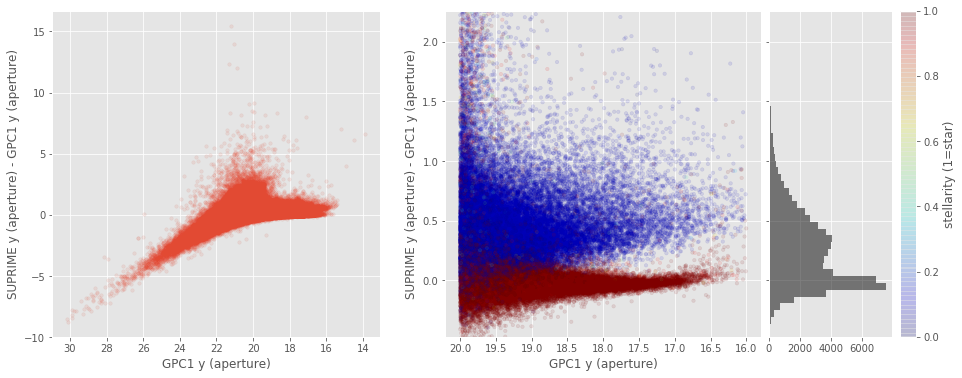

VIRCAM Y (aperture) - GPC1 y (aperture):
256358


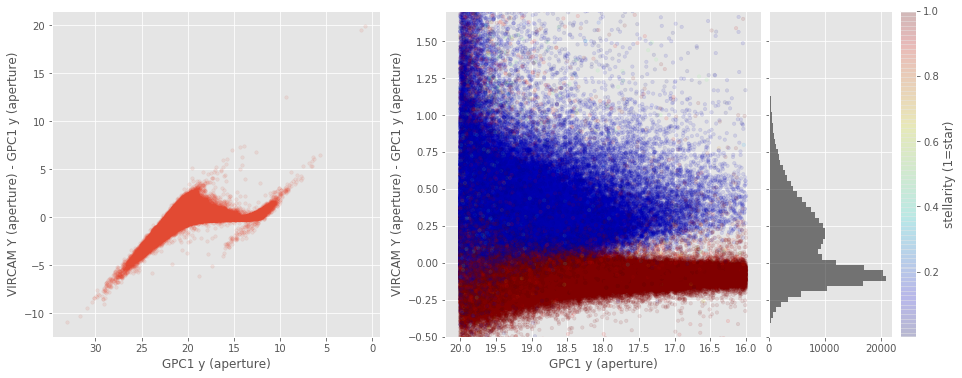

WFCAM Y (aperture) - GPC1 y (aperture):
219042


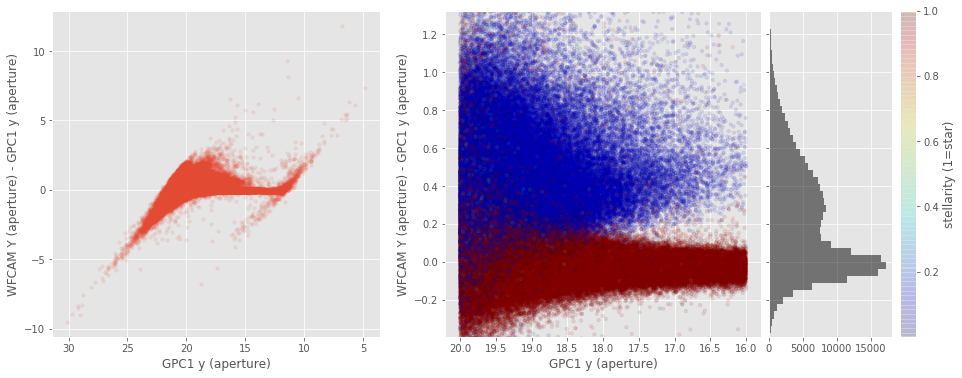

VIRCAM Y (aperture) - SUPRIME y (aperture):
31786


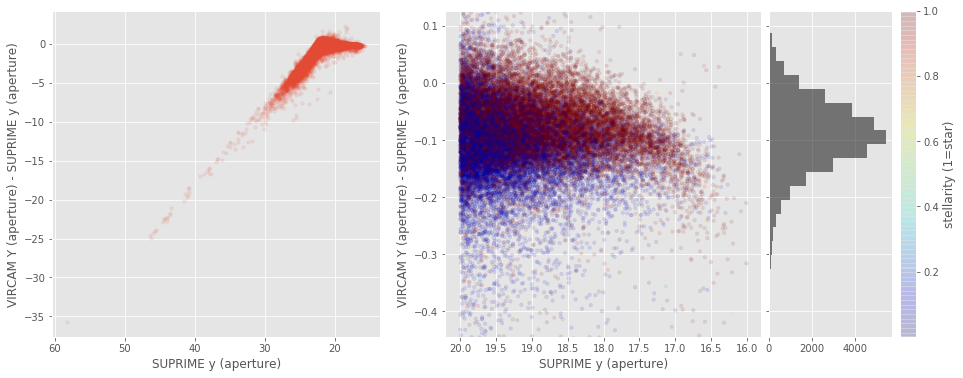

WFCAM Y (aperture) - SUPRIME y (aperture):
26629


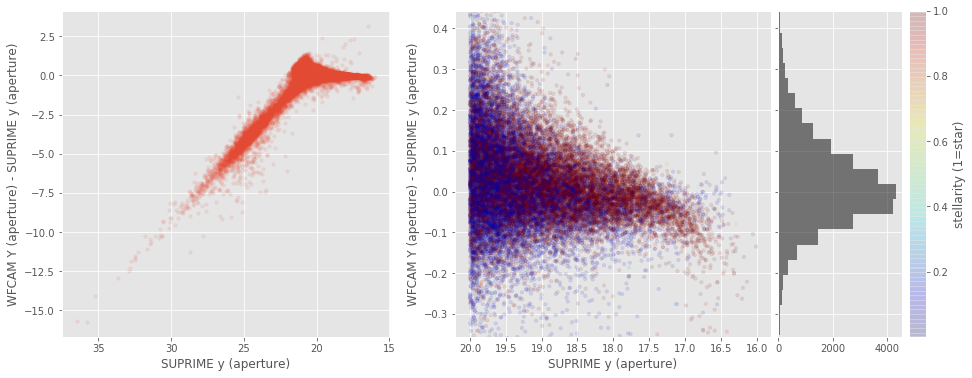

WFCAM Y (aperture) - VIRCAM Y (aperture):
141716


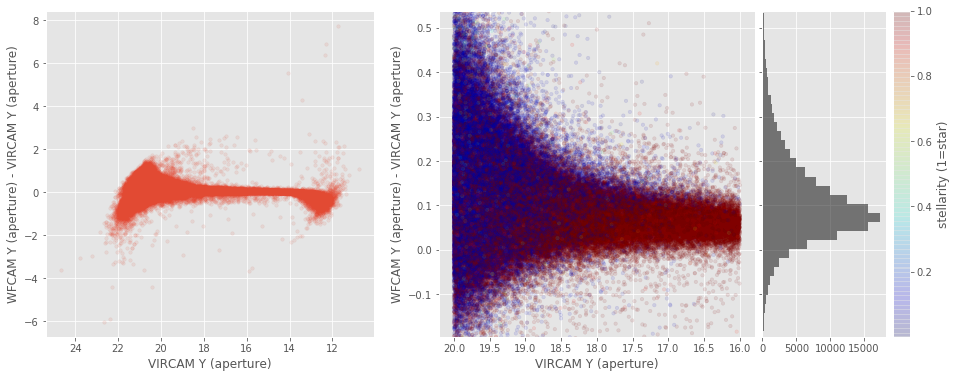

In [29]:
for band_of_a_kind in [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
       
        if basecol1 == "decam_g" and basecol2 == "kids_g":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)

        apcor_check(master_catalogue[col1], master_catalogue[col2], master_catalogue['stellarity'],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)
